# Analysis of brightfield data

## Import packages

In [437]:
import csv
import os
import re
import numpy
import seaborn
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
from statannot import add_stat_annotation

from scipy import stats
import matplotlib.pyplot as plt
from statannot import add_stat_annotation

In [438]:
import scanpy as sc
sc.settings.verbosity = 2  # verbosity: errors (0), warnings (1), info (2), hints (3)

In [439]:
sc.set_figure_params(dpi=150, color_map = 'viridis')

# Analysis V1: Read in CSV with pandas

In [440]:
resultaat = pd.read_csv("brightfield.csv")

In [441]:
resultaat.head(2)

,Name,Date,Condition,Spine Length,Diameter,Elongation Index,Chiron Pulse,Time Point
0,Condition_4_F_8,24-09-2020,Condition 4,401.813,263.0,1.527806,72h,144hAA
1,Condition_5_D_9,24-09-2020,Condition 5,1399.385,660.0,2.120280,72h,144hAA


In [442]:
pd.DataFrame(resultaat[['Condition','Date']])

,Condition,Date
0,Condition 4,24-09-2020
1,Condition 5,24-09-2020
2,Condition 1,23-09-2020
3,Condition 3,01-10-2020
4,Condition 4,30-09-2020
...,...,...
1615,Condition 4,23-09-2020
1616,Condition 5,24-09-2020
1617,Condition 5,24-09-2020
1618,Condition 4,24-09-2020


In [443]:
resultaat.shape

(1620, 8)

In [444]:
resultaat['plates'] = resultaat['Condition'].astype(str) + '_' + resultaat['Date'].astype(str)

In [445]:
resultaat['batches'] = resultaat['Date'].astype(str) + '_' + resultaat['Chiron Pulse'].astype(str)

In [446]:
import seaborn as sns
sns.color_palette('inferno', 4)

[(0.258234, 0.038571, 0.406485),
 (0.578304, 0.148039, 0.404411),
 (0.865006, 0.316822, 0.226055),
 (0.987622, 0.64532, 0.039886)]

In [447]:
resultaat[['Name','Date','Chiron Pulse', 'Time Point']].to_csv('20240729_gastruloids_date_chir_tp.csv')

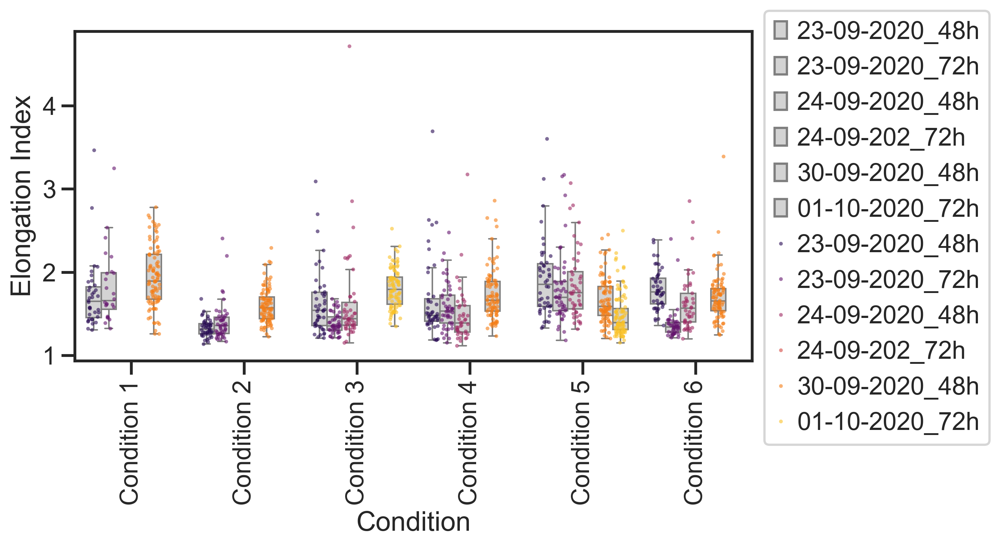

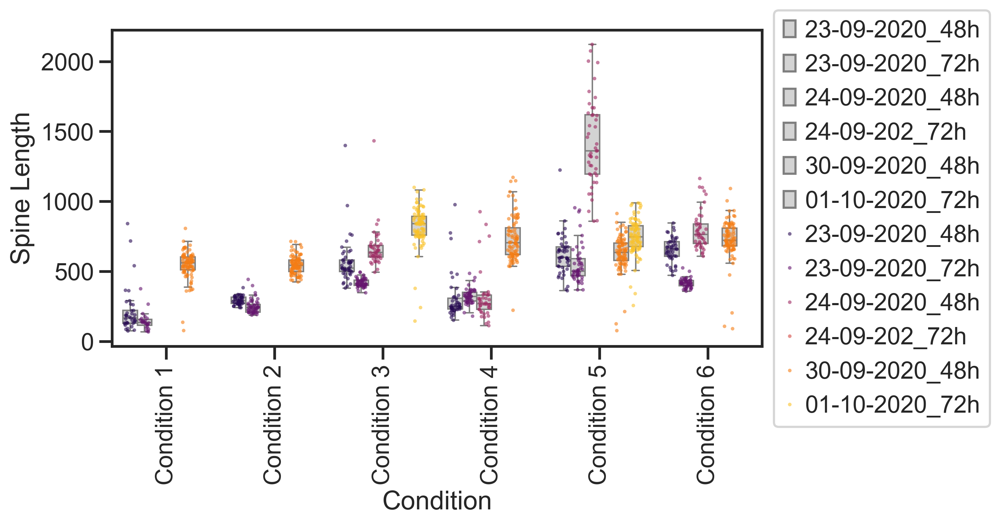

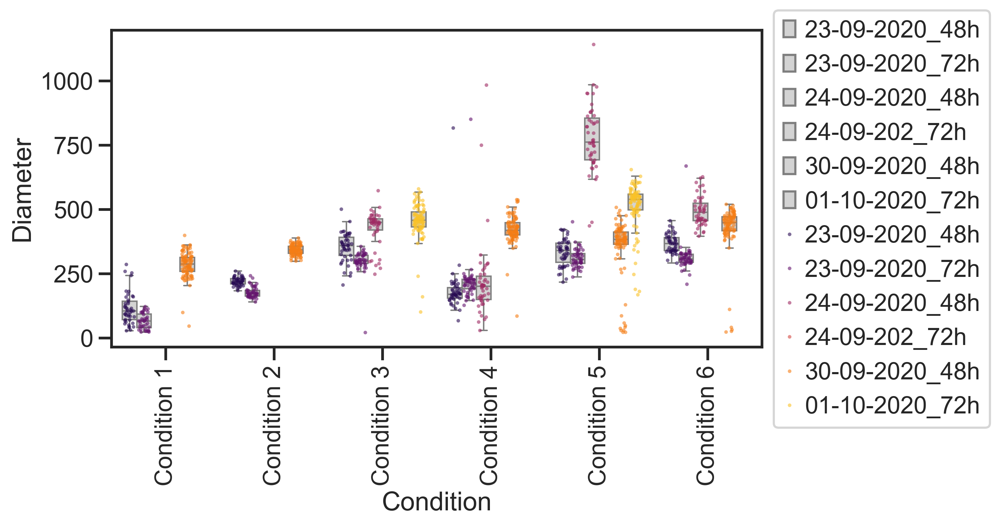

In [448]:
import seaborn as sns
sns.set_context('talk')
sns.set_style('white')
sns.set_style('ticks')
order = ['Condition 1','Condition 2','Condition 3','Condition 4','Condition 5','Condition 6']
hue_order = ['23-09-2020_48h','23-09-2020_72h', '24-09-2020_48h','24-09-202_72h', '30-09-2020_48h','01-10-2020_72h']

measurements = ['Elongation Index', 'Spine Length', 'Diameter']
for measurement in measurements:
    fig, ax = plt.subplots(figsize=(8,4))
    ax = sns.boxplot(data = resultaat,
               x = 'Condition',
               y = measurement, hue = 'batches',order = order,hue_order=hue_order,
                     showfliers = False, 
                palette =['lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey'],
                ax=ax)
    
    ax = sns.stripplot(data = resultaat,
               x = 'Condition',
               y = measurement,hue = 'batches',order=order,hue_order=hue_order,
                  ax=ax, palette = sns.color_palette('inferno', 6),
                  dodge = True, jitter=0.3, marker='o', alpha=0.6, size = 2.5)
    
    ax.tick_params(axis='x', labelrotation=90)
    ax.legend(bbox_to_anchor=(1, 1.1))
    plt.savefig('./figures/' + str(measurement)+'_datetime_boxplot.png',dpi = 150,bbox_inches='tight')

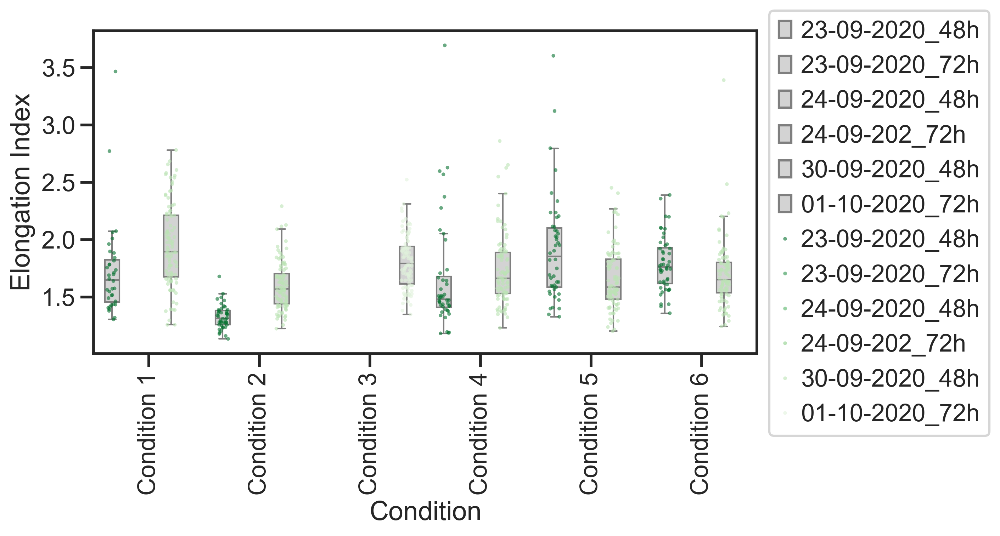

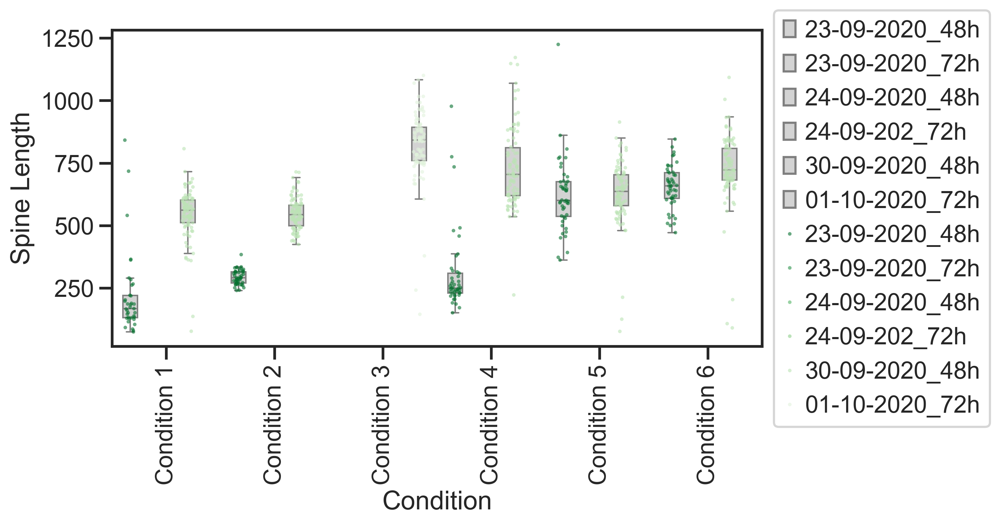

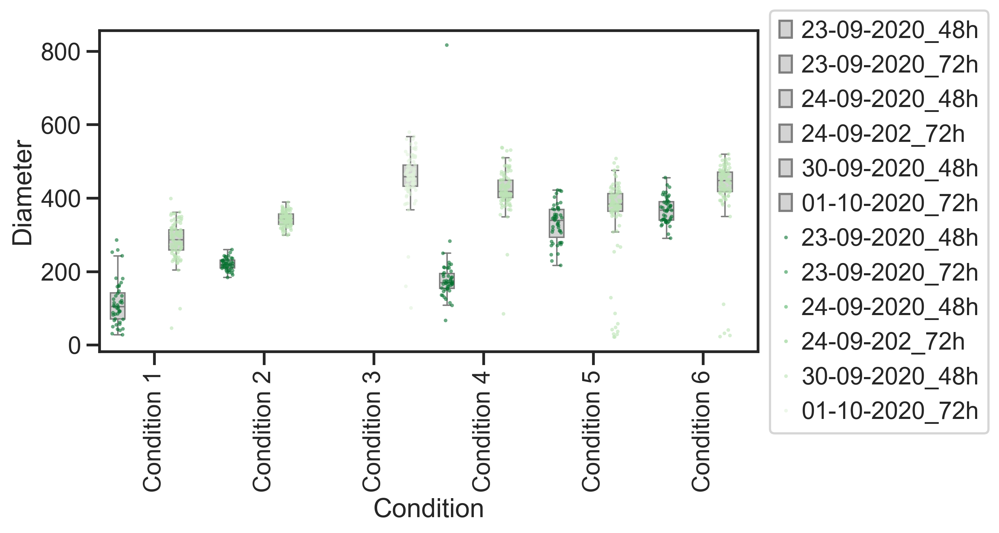

In [449]:
order = ['Condition 1','Condition 2','Condition 3','Condition 4','Condition 5','Condition 6']
hue_order = ['23-09-2020', '24-09-2020', '30-09-2020','01-10-2020']

measurements = ['Elongation Index', 'Spine Length', 'Diameter']
hue_order = ['23-09-2020_48h','23-09-2020_72h', '24-09-2020_48h','24-09-202_72h', '30-09-2020_48h','01-10-2020_72h']
filtered_best['batches'] = filtered_best['Date'].astype(str) + '_' + filtered_best['Chiron Pulse'].astype(str)

measurements = ['Elongation Index', 'Spine Length', 'Diameter']
for measurement in measurements:
    fig, ax = plt.subplots(figsize=(8,4))
    ax = sns.boxplot(data = filtered_best,
               x = 'Condition',
               y = measurement, hue = 'batches',order = order,hue_order=hue_order,
                     showfliers = False, 
                palette =['lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey'],
                ax=ax)
    
    ax = sns.stripplot(data = filtered_best,
               x = 'Condition',
               y = measurement,hue = 'batches',order=order,hue_order=hue_order,
                  ax=ax, palette = sns.color_palette('Greens_r', 6),
                  dodge = True, jitter=0.3, marker='o', alpha=0.6, size = 2.5)
    
    ax.tick_params(axis='x', labelrotation=90)
    ax.legend(bbox_to_anchor=(1, 1.1))
    plt.savefig(str(measurement)+'_finaldata_boxplot.png',dpi = 150,bbox_inches='tight')

Filter samples so that they have either a Chiron pulse at 72h and were imaged at 144hAA or they have a Chiron pulse at 48h and were imaged at 120hAA:

In [451]:
filtered = resultaat[((resultaat["Chiron Pulse"]=="72h") & (resultaat["Time Point"]=="144hAA")) | ((resultaat["Chiron Pulse"]=="48h") & (resultaat["Time Point"]=="120hAA"))]

In [452]:
filtered.head(2)

,Name,Date,Condition,Spine Length,Diameter,Elongation Index,Chiron Pulse,Time Point,plates,batches
0,Condition_4_F_8,24-09-2020,Condition 4,401.813,263.0,1.527806,72h,144hAA,Condition 4_24-09-2020,24-09-2020_72h
1,Condition_5_D_9,24-09-2020,Condition 5,1399.385,660.0,2.120280,72h,144hAA,Condition 5_24-09-2020,24-09-2020_72h


Filter samples so you have 144hAA data for Condition 3 and 120hAA data for all other conditions:

In [453]:
filtered120 = resultaat[((resultaat["Condition"]!="Condition 3") & (resultaat["Time Point"]=="120hAA")) | ((resultaat["Condition"]=="Condition 3") & (resultaat["Time Point"]=="144hAA"))]

In [454]:
filtered120.head(2)

,Name,Date,Condition,Spine Length,Diameter,Elongation Index,Chiron Pulse,Time Point,plates,batches
2,Condition_1_F_8,23-09-2020,Condition 1,165.829,113.0,1.467513,72h,120hAA,Condition 1_23-09-2020,23-09-2020_72h
3,Condition_3_H_10,01-10-2020,Condition 3,880.932,550.0,1.601695,72h,144hAA,Condition 3_01-10-2020,01-10-2020_72h


In [455]:
filtered_best = resultaat[((resultaat["Condition"]!="Condition 3") & (resultaat["Time Point"]=="120hAA") & (resultaat["Chiron Pulse"]=="48h")) | ((resultaat["Condition"]=="Condition 3") & (resultaat["Time Point"]=="144hAA") & (resultaat["Chiron Pulse"]=="72h"))]
filtered_best['Batch'] = filtered_best['Date']
filtered_best['Batch'] = filtered_best['Batch'].replace({'01-10-2020': 'B', '30-09-2020': 'B', '23-09-2020':'A', '24-09-2020':'A'})
filtered_best = filtered_best.sort_values(by='Batch')
filtered_best['Condition_plot'] = [x[1] for x in filtered_best['Condition'].str.split(' ')]
filtered_best['cond_batch'] = filtered_best['Condition_plot'] + '_'+ filtered_best['Batch']
filtered_best.head(2)


/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_21803/1509306191.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_best['Batch'] = filtered_best['Date']
/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_21803/1509306191.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_best['Batch'] = filtered_best['Batch'].replace({'01-10-2020': 'B', '30-09-2020': 'B', '23-09-2020':'A', '24-09-2020':'A'})


,Name,Date,Condition,Spine Length,Diameter,Elongation Index,Chiron Pulse,Time Point,plates,batches,Batch,Condition_plot,cond_batch
810,Condition_6_E_2,23-09-2020,Condition 6,507.964,325.0,1.562966,48h,120hAA,Condition 6_23-09-2020,23-09-2020_48h,A,6,6_A
852,Condition_3_G_9,24-09-2020,Condition 3,612.359,314.0,1.950188,72h,144hAA,Condition 3_24-09-2020,24-09-2020_72h,A,3,3_A


In [456]:
filtered['Condition_plot'] = [x[1] for x in filtered['Condition'].str.split(' ')]
filtered['Chiron Pulse'] = filtered['Chiron Pulse'].astype('category')
filtered['Time Point'] = filtered['Time Point'].astype('category')
filtered['Batch'] = filtered['Date'].replace({'01-10-2020': 'B', '30-09-2020': 'B', '23-09-2020':'A', '24-09-2020':'A'})
filtered['batches'] = filtered['Batch'].astype(str) + '_'+ filtered['Chiron Pulse'].astype(str) + '_' + filtered['Time Point'].astype(str)
filtered.head(2)

/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_21803/2264806992.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered['Condition_plot'] = [x[1] for x in filtered['Condition'].str.split(' ')]
/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_21803/2264806992.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered['Chiron Pulse'] = filtered['Chiron Pulse'].astype('category')
/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_21803/2264806992.py:3: SettingWithCopyWarnin

,Name,Date,Condition,Spine Length,Diameter,Elongation Index,Chiron Pulse,Time Point,plates,batches,Condition_plot,Batch
0,Condition_4_F_8,24-09-2020,Condition 4,401.813,263.0,1.527806,72h,144hAA,Condition 4_24-09-2020,A_72h_144hAA,4,A
1,Condition_5_D_9,24-09-2020,Condition 5,1399.385,660.0,2.120280,72h,144hAA,Condition 5_24-09-2020,A_72h_144hAA,5,A


# Analysis V1: Plots

In [34]:
import seaborn as sns
sc.set_figure_params(dpi=250, color_map = 'viridis')
sns.set_style('white')
sns.set_style('ticks')
sns.set_context('talk')


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

1 v.s. 2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.165e-17 U_stat=1.483e+04
1 v.s. 3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.987e+03
1 v.s. 4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.121e-04 U_stat=1.142e+04
1 v.s. 5: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.890e-03 U_stat=1.083e+04
1 v.s. 6: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.349e-03 U_stat=1.116e+04


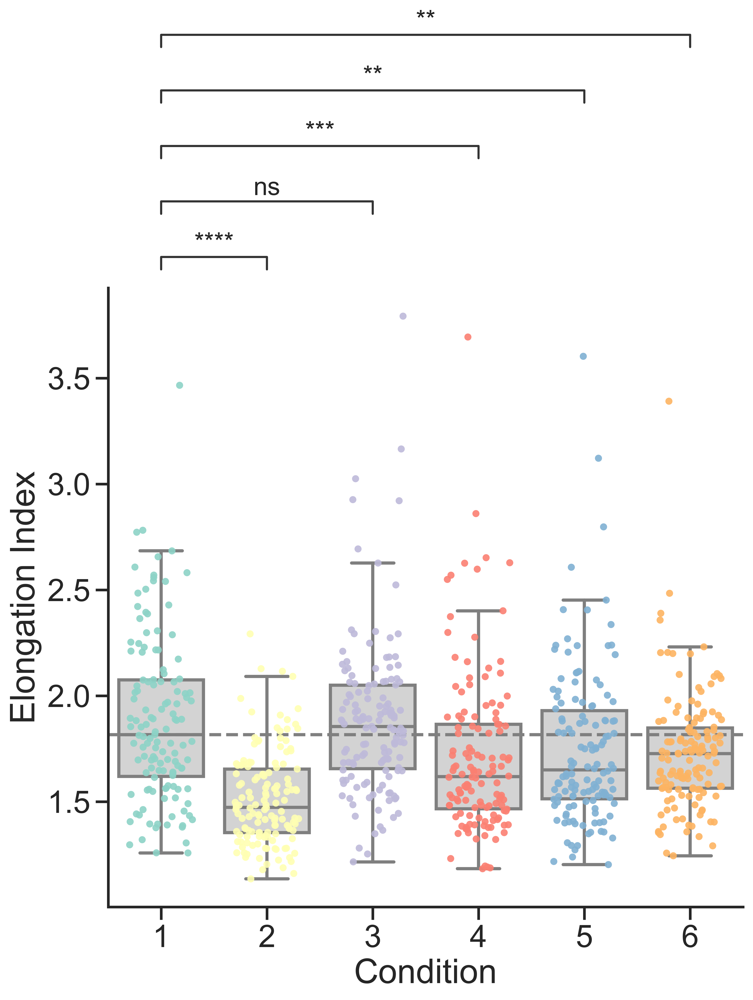

In [45]:
fontsize = 24
box_pairs = [('1','2'),('1','3'),('1','4'),('1','5'),('1','6')]

fig, ax = plt.subplots(figsize=(8,8))
plt.axhline(y = filtered_best[filtered_best['Condition_plot'] == '1']['Elongation Index'].median(), 
            color = 'grey', linestyle = 'dashed')

ax = sns.boxplot(data=filtered_best, x="Condition_plot", y="Elongation Index", showfliers = False, color = "Batch",
            palette=['lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey'],#"colorblind", 
                order=["1", "2", "3", "4", "5", "6"],
            ax=ax)

ax = sns.stripplot(data=filtered_best, x="Condition_plot", y="Elongation Index", 
              order=["1", "2", "3", "4", "5", "6"],
              ax=ax,
            palette = "Set3",  
              dodge = True, jitter=0.3, marker='o', alpha=0.9, size = 5)

add_stat_annotation(ax, 
                    data=filtered_best, x="Condition_plot", y="Elongation Index",
                    order=["1", "2", "3", "4", "5", "6"],
                    test="Mann-Whitney",box_pairs = box_pairs, 
                    loc='outside', verbose=2,text_format='star')



plt.setp(ax.xaxis.get_majorticklabels(), ha='center', fontsize = 22)
plt.setp(ax.yaxis.get_majorticklabels(), ha='right', fontsize = 22)
ax.set_xlabel("Condition", fontsize = fontsize)
ax.set_ylabel("Elongation Index",fontsize = fontsize)
plt.legend([], frameon=False)
#ax.set_title('x')
sns.despine()


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

2_A v.s. 2_B: t-test independent samples with Bonferroni correction, P_val=4.145e-13 stat=-8.330e+00
1_A v.s. 1_B: t-test independent samples with Bonferroni correction, P_val=1.745e-02 stat=-3.035e+00
3_A v.s. 3_B: t-test independent samples with Bonferroni correction, P_val=3.812e-03 stat=3.497e+00
4_A v.s. 4_B: t-test independent samples with Bonferroni correction, P_val=1.000e+00 stat=-1.095e+00
5_A v.s. 5_B: t-test independent samples with Bonferroni correction, P_val=7.157e-04 stat=3.966e+00
6_A v.s. 6_B: t-test independent samples with Bonferroni correction, P_val=3.622e-01 stat=1.894e+00
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

2_A v.s. 2_B: t-test independent samples with Bonferroni correction, 

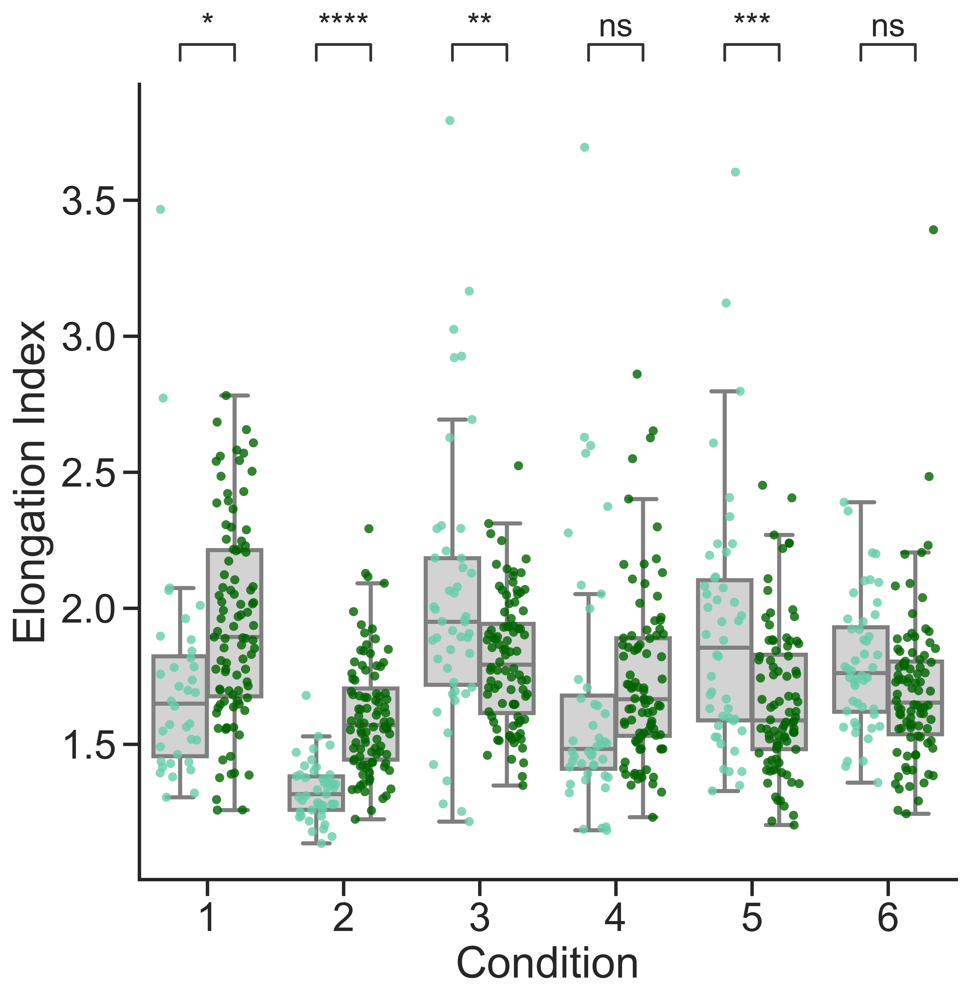

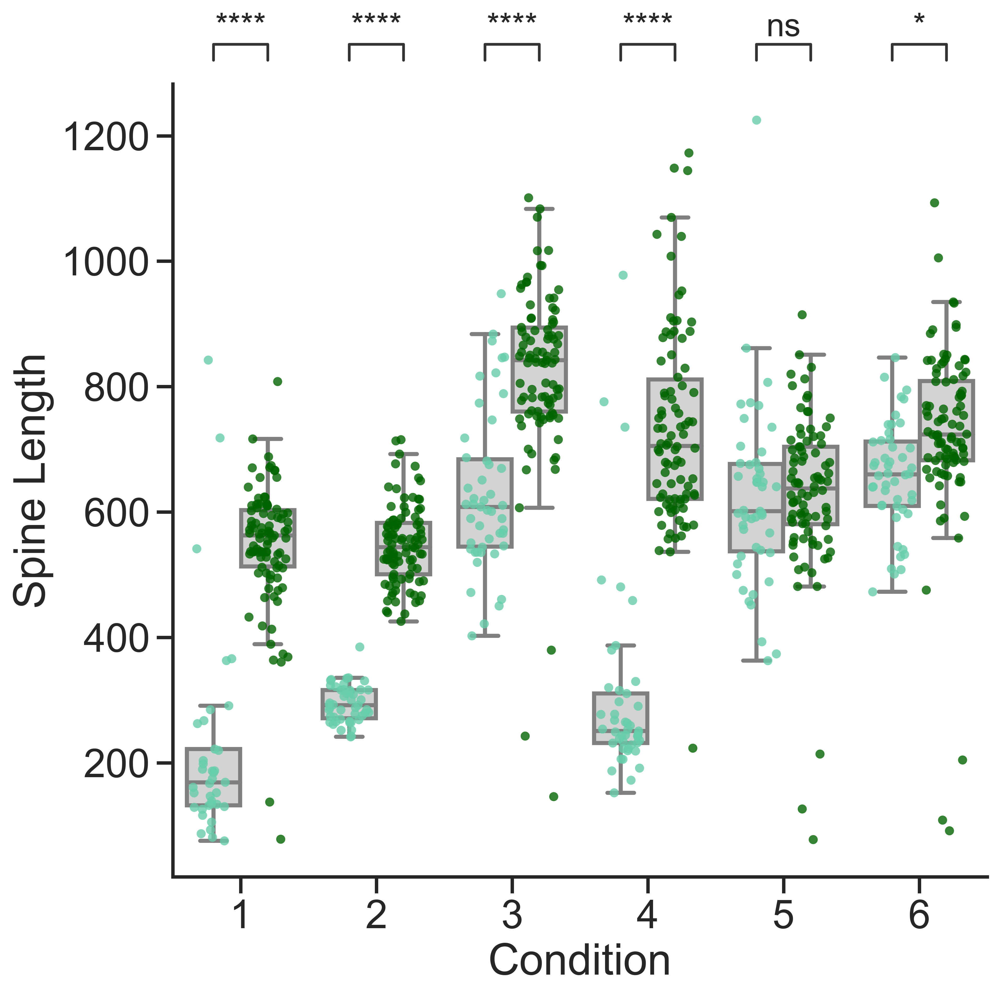

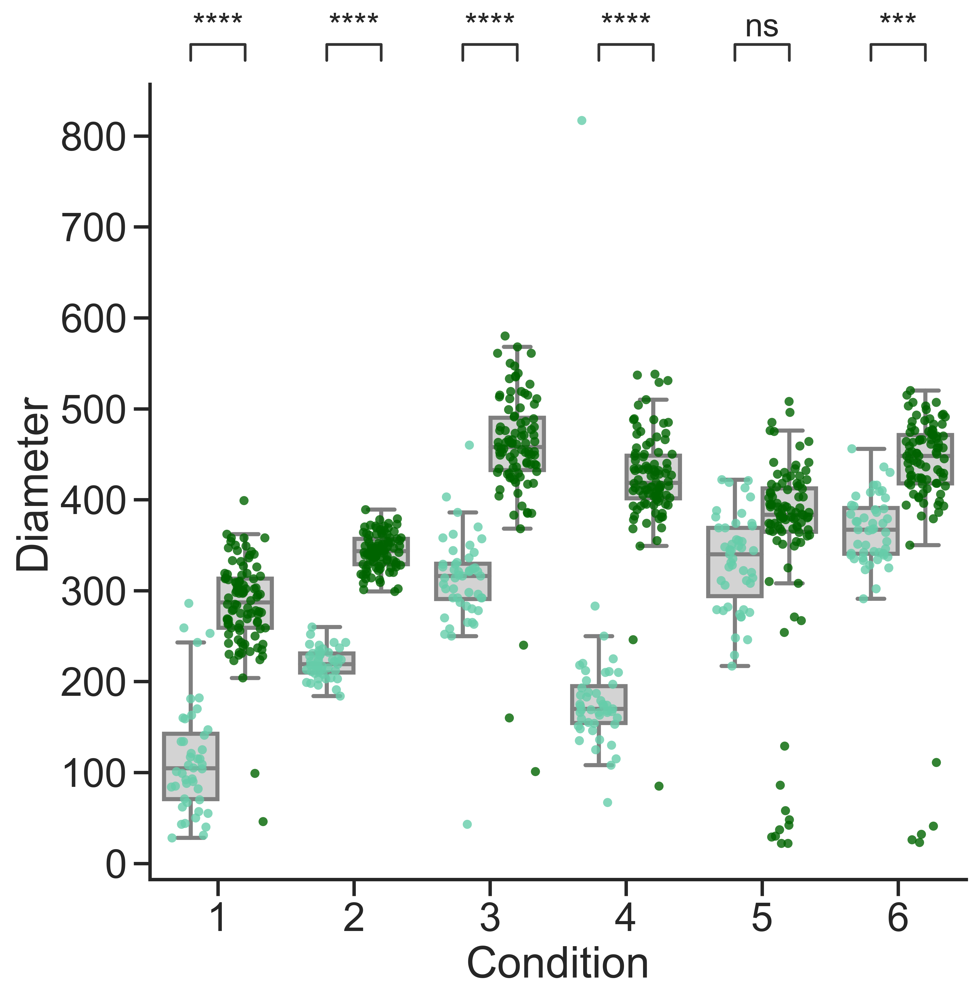

In [24]:
fontsize = 24
box_pairs = [(('1','A'),('1','B')),(('2','A'),('2','B')),(('3','A'),('3','B')),
            (('4','A'),('4','B')),(('5','A'),('5','B')),(('6','A'),('6','B'))]

plots = ['Elongation Index','Spine Length', 'Diameter']
for y in plots:
    fig, ax = plt.subplots(figsize=(8,8))
    ax = sns.boxplot(data=filtered_best, x="Condition_plot", y=y, showfliers = False, 
                     color = "Batch", hue = 'Batch',
                palette=['lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey'],#"colorblind", 
                    order=["1", "2", "3", "4", "5", "6"],
                ax=ax)

    ax = sns.stripplot(data=filtered_best, x="Condition_plot", y=y, hue = "Batch",
                  order=["1", "2", "3", "4", "5", "6"],
                  ax=ax,
                palette = ['mediumaquamarine','darkgreen'],  
                  dodge = True, jitter=0.3, marker='o', alpha=0.8, size = 5)
    add_stat_annotation(ax, 
                        data=filtered_best, x="Condition_plot", y=y, hue = "Batch",
                        order=["1", "2", "3", "4", "5", "6"],
                        test="t-test_ind",box_pairs = box_pairs, 
                        loc='outside', verbose=2,text_format='star')



    plt.setp(ax.xaxis.get_majorticklabels(), ha='center', fontsize = 22)
    plt.setp(ax.yaxis.get_majorticklabels(), ha='right', fontsize = 22)
    ax.set_xlabel("Condition", fontsize = fontsize)
    ax.set_ylabel(y,fontsize = fontsize)
    plt.legend([], frameon=False)
    sns.despine()

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

4_48h_120hAA v.s. 4_48h_144hAA: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.575e-05 U_stat=4.047e+03
5_48h_120hAA v.s. 5_48h_144hAA: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.581e+03
3_48h_120hAA v.s. 3_48h_144hAA: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.158e+03
6_48h_120hAA v.s. 6_48h_144hAA: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.534e-02 U_stat=4.014e+03
5_48h_120hAA v.s. 5_72h_120hAA: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.942e+03
6_48h_120hAA v.s. 6_72h_120hAA: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.049e-16 U_stat=5.923e+03
4_48h_120hAA v.s. 4_72h_120hAA: Mann-Whitney-Wilcoxon te

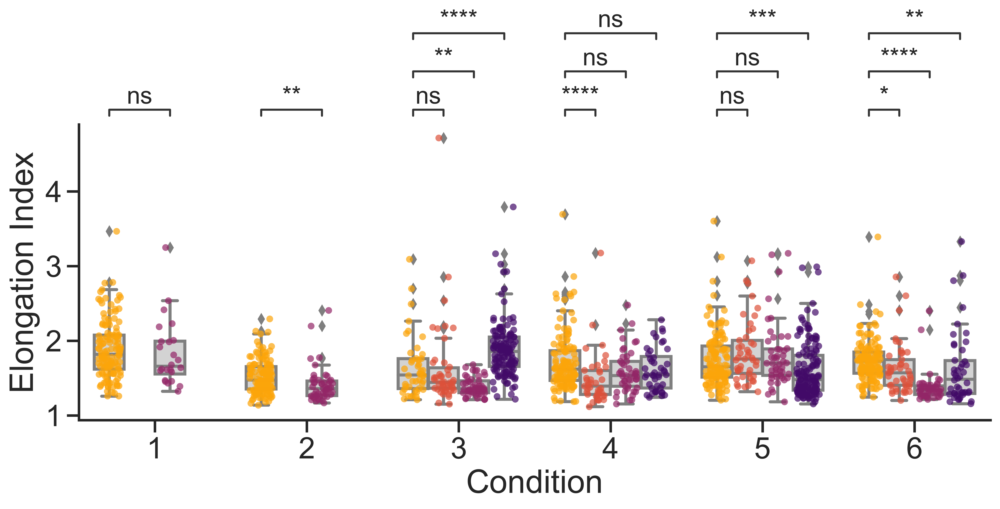

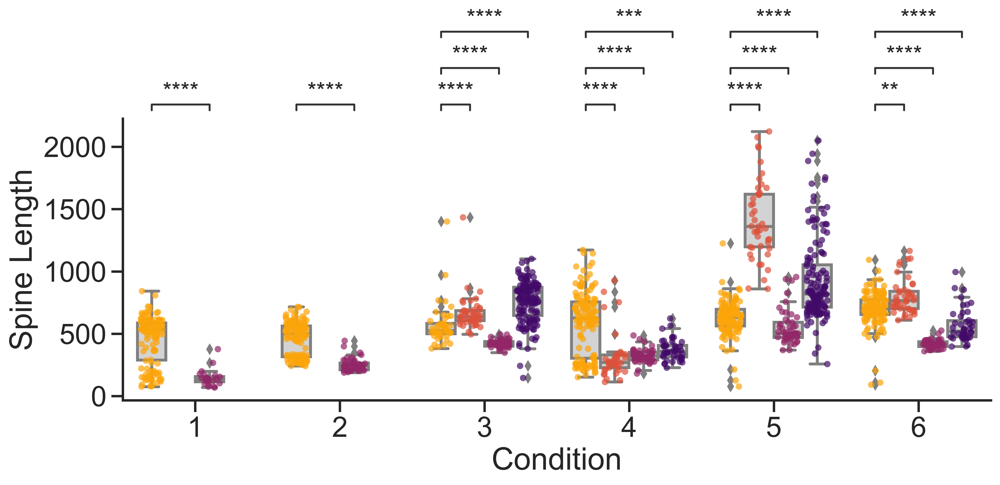

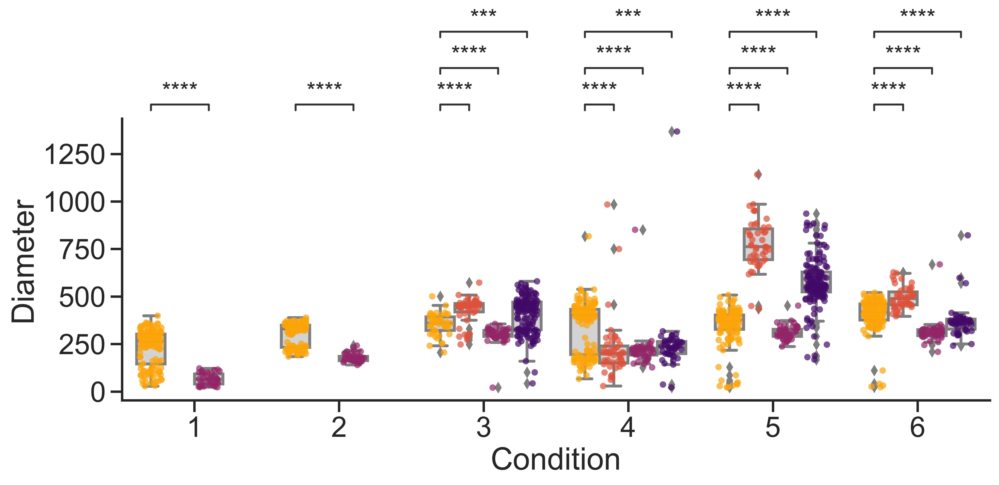

In [49]:
fontsize = 24
resultaat['Condition_plot'] = [x[1] for x in resultaat['Condition'].str.split(' ')]
resultaat['Batch'] = resultaat['Date'].replace({'01-10-2020': 'B', '30-09-2020': 'B', '23-09-2020':'A', '24-09-2020':'A'})
resultaat['batches'] = resultaat['Batch'].astype(str) + '_'+ resultaat['Chiron Pulse'].astype(str) + '_' + resultaat['Time Point'].astype(str)
resultaat['batches'] = resultaat['batches'].astype('category')

resultaat['conditions'] = resultaat['Chiron Pulse'].astype(str) + '_' + resultaat['Time Point'].astype(str)
resultaat['conditions'] = resultaat['conditions'].astype('category')


box_pairs = [(('1','48h_120hAA'),('1','72h_120hAA')),
             (('2','48h_120hAA'),('2','72h_120hAA')),
             (('3','48h_120hAA'),('3','72h_120hAA')),
             (('3','48h_120hAA'),('3','72h_144hAA')),
             (('3','48h_120hAA'),('3','48h_144hAA')),          
             (('4','48h_120hAA'),('4','72h_120hAA')),
             (('4','48h_120hAA'),('4','72h_144hAA')),
             (('4','48h_120hAA'),('4','48h_144hAA')),           
             (('5','48h_120hAA'),('5','72h_120hAA')),
             (('5','48h_120hAA'),('5','72h_144hAA')),
             (('5','48h_120hAA'),('5','48h_144hAA')),           
            (('6','48h_120hAA'),('6','72h_120hAA')),
             (('6','48h_120hAA'),('6','72h_144hAA')),
             (('6','48h_120hAA'),('6','48h_144hAA'))]

plots = ['Elongation Index','Spine Length', 'Diameter']
for y in plots:

    fig, ax = plt.subplots(figsize=(12,4))
    #plt.axhline(y = filtered[filtered['Condition_plot'] == '1'][y].median(), 
    #            color = 'grey', linestyle = 'dashed')

    ax = sns.boxplot(data=resultaat, x="Condition_plot", y=y, hue = 'conditions',
                palette=['lightgrey'],#"colorblind", 
                    order=["1", "2", "3", "4", "5", "6"],
                ax=ax)

    ax = sns.stripplot(data=resultaat, x="Condition_plot", y=y, hue = 'conditions',
                  order=["1", "2", "3", "4", "5", "6"],
                  ax=ax,
                palette = 'inferno_r',#['gold','coral','plum','crimson','steelblue','navy'] , 
                  dodge = True, jitter=0.3, marker='o', alpha=0.7, size = 5)


    add_stat_annotation(ax, 
                        data=resultaat, x="Condition_plot", y=y, hue = 'conditions',
                        order=[ "1","2","3", "4", "5", "6"],
                        test="Mann-Whitney",box_pairs = box_pairs, 
                        loc='outside', verbose=2,text_format='star')



    plt.setp(ax.xaxis.get_majorticklabels(), ha='center', fontsize = 22)
    plt.setp(ax.yaxis.get_majorticklabels(), ha='right', fontsize = 22)
    ax.set_xlabel("Condition", fontsize = fontsize)
    ax.set_ylabel(y, fontsize = fontsize)
    plt.legend([], frameon=False)
    #ax.set_title('x')
    sns.despine()

In [54]:
filtered_best['test'] = filtered_best['Spine Length'] /filtered_best['Diameter']

In [63]:
filtered_best[filtered_best['Elongation Index'] > 3]

,Name,Date,Condition,Spine Length,Diameter,Elongation Index,Chiron Pulse,Time Point,Batch,Condition_plot,cond_batch,test
1015,Condition_5_A_2,23-09-2020,Condition 5,774.169,248.0,3.121649,48h,120hAA,A,5,5_A,3.121649
483,Condition_3_F_7,24-09-2020,Condition 3,846.980,280.0,3.024929,72h,144hAA,A,3,3_A,3.024929
1445,Condition_3_H_11,24-09-2020,Condition 3,816.669,258.0,3.165384,72h,144hAA,A,3,3_A,3.165384
1599,Condition_5_F_3,23-09-2020,Condition 5,1224.947,340.0,3.602785,48h,120hAA,A,5,5_A,3.602785
1087,Condition_4_G_5,23-09-2020,Condition 4,775.706,210.0,3.693838,48h,120hAA,A,4,4_A,3.693838
1073,Condition_1_G_4,23-09-2020,Condition 1,842.221,243.0,3.465930,48h,120hAA,A,1,1_A,3.465930
1088,Condition_3_C_7,24-09-2020,Condition 3,948.091,250.0,3.792364,72h,144hAA,A,3,3_A,3.792364
1391,Condition_6_F_12,30-09-2020,Condition 6,108.507,32.0,3.390844,48h,120hAA,B,6,6_B,3.390844


# Analysis V2: read in data and compare to V1

In [1241]:
import glob
import os

path = '/Users/m.blotenburg/Documents/Projects/preculture_manuscript/rev_analyse/notebooks/data/morgana/' # use your path
all_files = glob.glob(os.path.join(path , "*.json"))

li = []

for filename in all_files:
    df = pd.read_json(filename)
   # df['sample'] = ['-'.join(x[4:8]) for x in df['input_file'].str.split('_')]
    df['sample'] = df['input_file']
    df['sample'] = [str(i).replace(".lif - ", "-") for i in df['sample']]
    df['sample'] = [str(i).replace("Focused_mGast_10x_bf_", "") for i in df['sample']]
    df['sample'] = [str(i).replace("Focused-mGastruloids-", "") for i in df['sample']]
    df['sample'] = [str(i).replace("Focused_mGast_bf_", "") for i in df['sample']]
    df['sample'] = [str(i).replace("Focused_mGastruloids_", "") for i in df['sample']]
    df['sample'] = [str(i).replace("_cropped00.tif", "") for i in df['sample']]
    df['sample'] = [str(i).replace("24092020-Condition5_E9", "24092020-Condition_5_E_9") for i in df['sample']]

    df['AR'] = df['major_axis_length']/df['minor_axis_length']

    vals = ['major_axis_length','minor_axis_length','equivalent_diameter','AR','sample','input_file']
    df_short = df[vals]
    df_short.index = df_short['sample']
    li.append(df_short)

In [1242]:
new_results = pd.concat(li, axis=0)

In [1243]:
new_results['batch'] = ['_'.join(x[0:2]) for x in new_results['sample'].str.split('_')]

In [1244]:
new_results['batch'].unique()

array(['200923-Condition_4', '24092020-Condition_3', '200923-Condition_1',
       '24092020-Condition_6', '30092020-Condition_6',
       '200923-Condition_5', '30092020-Condition_2',
       '24092020-Condition_5', '200923-Condition_2', '200923-Condition_6',
       '30092020-Condition_1', '30092020-Condition_4',
       '200923-Condition_3', '24092020-Condition_4',
       '01102020-Condition_5', '01102020-Condition_3'], dtype=object)

In [1245]:
new_results.shape

(1310, 7)

In [1246]:
c5_200930 = pd.read_csv(path + 'c5_200930.csv', sep = ';').rename(columns={'Filename':'input_file',
                                                                          'Major Axis Length':'major_axis_length',
                                                                          'Minor Axis Length':'minor_axis_length'})
c5_200930['AR'] = [float(str(i).replace(",", ".")) for i in c5_200930["AR"]]
c5_200930['major_axis_length'] = [float(str(i).replace(",", ".")) for i in c5_200930["major_axis_length"]]
c5_200930['minor_axis_length'] = [float(str(i).replace(",", ".")) for i in c5_200930["minor_axis_length"]]
c5_200930['sample'] = c5_200930['input_file']
c5_200930['sample'] = [str(i).replace(".lif - ", "-") for i in c5_200930['sample']]
c5_200930['sample'] = [str(i).replace("Focused_mGast_bf_", "") for i in c5_200930['sample']]
c5_200930['sample'] = [str(i).replace("_cropped00.tif", "") for i in c5_200930['sample']]
c5_200930.index = c5_200930['sample']

In [1247]:
new_results = pd.concat([new_results, c5_200930])

In [1248]:
new_results.shape

(1387, 7)

In [1249]:
#dates = pd.DataFrame([x for x in resultaat['Date'].str.split('-')])
#resultaat['date'] = dates[2] + dates[1] + dates[0]

resultaat['sample'] = resultaat['Date'] + '-' + resultaat['Name']
#resultaat['sample'] = [str(i).replace("_", "-") for i in resultaat['sample']]
resultaat['sample'] = [str(i).replace("23-09-2020", "200923") for i in resultaat['sample']]
resultaat['sample'] = [str(i).replace("24-09-2020-", "24092020-") for i in resultaat['sample']]
resultaat['sample'] = [str(i).replace("30-09-2020-", "30092020-") for i in resultaat['sample']]
resultaat['sample'] = [str(i).replace("01-10-2020-", "01102020-") for i in resultaat['sample']]
resultaat.index = resultaat['sample']
resultaat.head(2)

,Name,Date,Condition,Spine Length,Diameter,Elongation Index,Chiron Pulse,Time Point,plates,batches,date,sample,Condition_plot,Batch,conditions
sample,,,,,,,,,,,,,,,
24092020-Condition_4_F_8,Condition_4_F_8,24-09-2020,Condition 4,401.813,263.0,1.527806,72h,144hAA,Condition 4_24-09-2020,A_72h_144hAA,20200924,24092020-Condition_4_F_8,4,A,72h_144hAA
24092020-Condition_5_D_9,Condition_5_D_9,24-09-2020,Condition 5,1399.385,660.0,2.120280,72h,144hAA,Condition 5_24-09-2020,A_72h_144hAA,20200924,24092020-Condition_5_D_9,5,A,72h_144hAA


In [1250]:
compare_vals = new_results.copy()
compare_vals[['Spine Length', 'Diameter','Elongation Index',
              'Chiron Pulse','Time Point','Condition']] = resultaat[['Spine Length', 'Diameter','Elongation Index',
                                                                     'Chiron Pulse','Time Point','Condition']]



In [1251]:
compare_vals['Condition'] = [str(i).replace("Condition ", "") for i in compare_vals['Condition']]


In [1252]:
import warnings
warnings.filterwarnings("ignore")

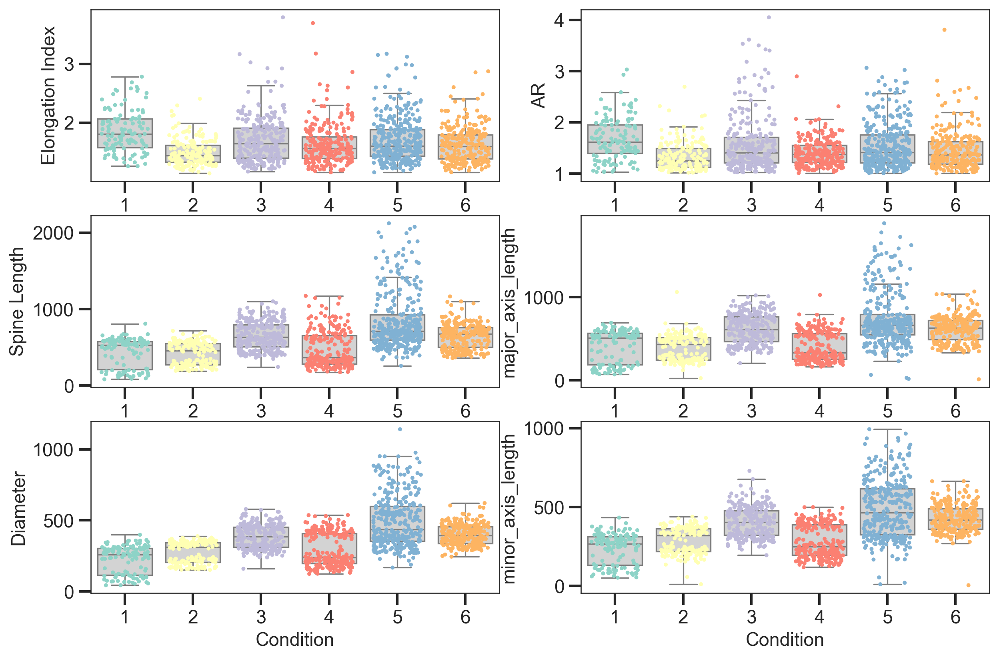

In [1253]:
sc.set_figure_params(dpi=120)
sns.set_style('white')
sns.set_style('ticks')

fig,ax = plt.subplots(3,2,figsize = (12,8))
ax = ax.flatten()
order = ['1','2','3','4','5','6']
pal1 = ['lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey']
ax[0] = sns.boxplot(data = compare_vals[~compare_vals.duplicated(keep = 'first')],
                    x = 'Condition', 
                    y  = 'Elongation Index', ax = ax[0], palette = pal1, order = order,
                    fliersize= False)

ax[1] = sns.boxplot(data = compare_vals[~compare_vals.duplicated(keep = 'first')],
                    x = 'Condition',
                    y  = 'AR', ax = ax[1], palette = pal1, order = order,
                    fliersize= False)


ax[2] = sns.boxplot(data = compare_vals[~compare_vals.duplicated(keep = 'first')],
                    x = 'Condition',
                    y  = 'Spine Length', ax = ax[2], palette = pal1, order = order,
                    fliersize= False)

ax[3] = sns.boxplot(data = compare_vals[~compare_vals.duplicated(keep = 'first')],
                    x = 'Condition',
                    y  = 'major_axis_length', ax = ax[3], palette = pal1, order = order,
                    fliersize= False)

ax[4] = sns.boxplot(data = compare_vals[~compare_vals.duplicated(keep = 'first')],
                    x = 'Condition',
                    y  = 'Diameter', ax = ax[4], palette = pal1, order = order,
                    fliersize= False)

ax[5] = sns.boxplot(data = compare_vals[~compare_vals.duplicated(keep = 'first')],
                    x = 'Condition',
                    y  = 'minor_axis_length', ax = ax[5], palette = pal1, order = order,
                    fliersize= False)


ax[0] = sns.stripplot(data = compare_vals[~compare_vals.duplicated(keep = 'first')],
                    x = 'Condition', 
                    y  = 'Elongation Index', ax = ax[0], palette = 'Set3', order = order,jitter = 0.35, size = 3
                    )

ax[1] = sns.stripplot(data = compare_vals[~compare_vals.duplicated(keep = 'first')],
                    x = 'Condition',
                    y  = 'AR', ax = ax[1], palette = 'Set3', order = order,jitter = 0.35, size = 3
                    )


ax[2] = sns.stripplot(data = compare_vals[~compare_vals.duplicated(keep = 'first')],
                    x = 'Condition',
                    y  = 'Spine Length', ax = ax[2], palette = 'Set3', order = order,jitter = 0.35, size = 3
                    )

ax[3] = sns.stripplot(data = compare_vals[~compare_vals.duplicated(keep = 'first')],
                    x = 'Condition',
                    y  = 'major_axis_length', ax = ax[3], palette = 'Set3', order = order,jitter = 0.35, size = 3
                    )

ax[4] = sns.stripplot(data = compare_vals[~compare_vals.duplicated(keep = 'first')],
                    x = 'Condition',
                    y  = 'Diameter', ax = ax[4], palette = 'Set3', order = order,jitter = 0.35, size = 3
                    )

ax[5] = sns.stripplot(data = compare_vals[~compare_vals.duplicated(keep = 'first')],
                    x = 'Condition',
                    y  = 'minor_axis_length', ax = ax[5], palette = 'Set3', order = order,jitter = 0.35, size = 3
                    )

plt.savefig(save + 'figures/brightfield/20240805_comparison_analysis.png', dpi = 300)

In [1255]:
results_cp = resultaat.copy()

results_cp['Condition'] = [str(i).replace("Condition ", "") for i in results_cp['Condition']]


pd.DataFrame(results_cp[['Condition','Time Point','Chiron Pulse']].value_counts()).sort_values(by=['Condition','Time Point'])[0] / pd.DataFrame(compare_vals[['Condition','Time Point','Chiron Pulse']].value_counts()).sort_values(by=['Condition','Time Point'])[0]




Condition  Time Point  Chiron Pulse
1          120hAA      48h             1.290909
                       72h             2.352941
2          120hAA      48h             1.066667
                       72h             1.200000
3          120hAA      48h             1.200000
                       72h             1.043478
           144hAA      48h             1.170732
                       72h             1.051095
4          120hAA      48h             1.099237
                       72h             1.230769
           144hAA      48h             1.468750
                       72h             1.230769
5          120hAA      48h             1.190083
                       72h             1.142857
           144hAA      48h             1.116279
                       72h             1.152000
6          120hAA      48h             1.125984
                       72h             1.116279
           144hAA      48h             1.230769
                       72h             1.200000
Name

In [1257]:
compare_vals['Date'] = resultaat['Date']
compare_vals['Condition_plot'] = compare_vals['Condition']

In [1258]:
compare_vals = compare_vals[~compare_vals.duplicated(keep = 'first')]

In [1259]:
sc.set_figure_params(dpi = 120)
sns.set_style('white')
sns.set_style('ticks')
sns.set_context('talk')

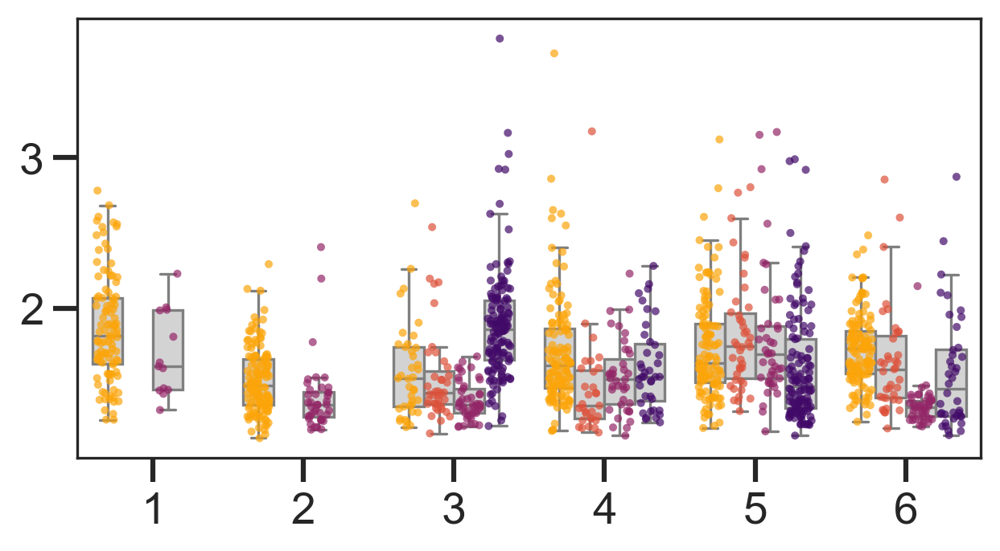

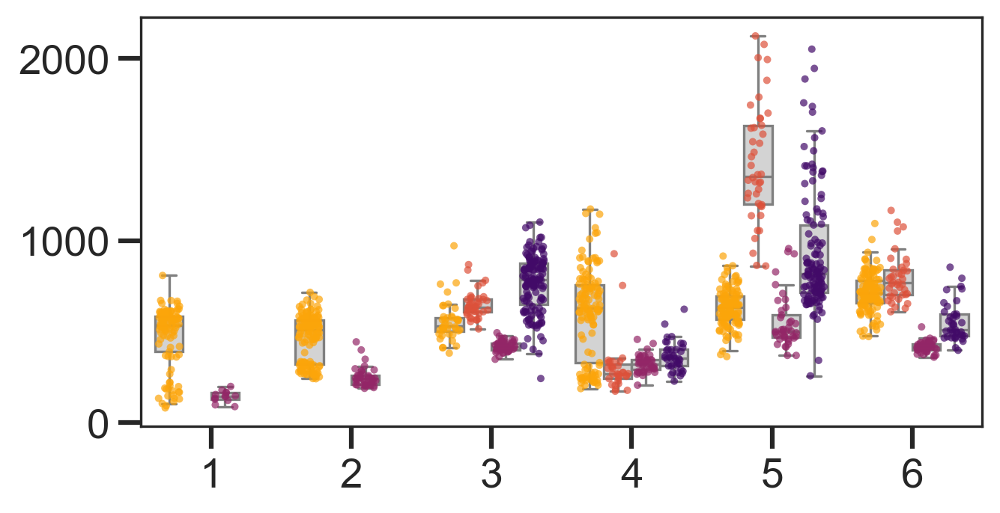

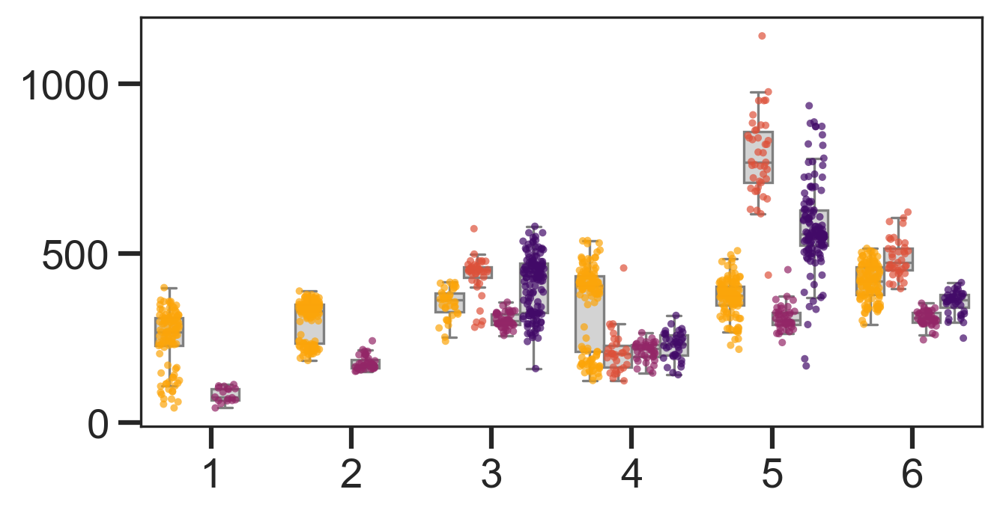

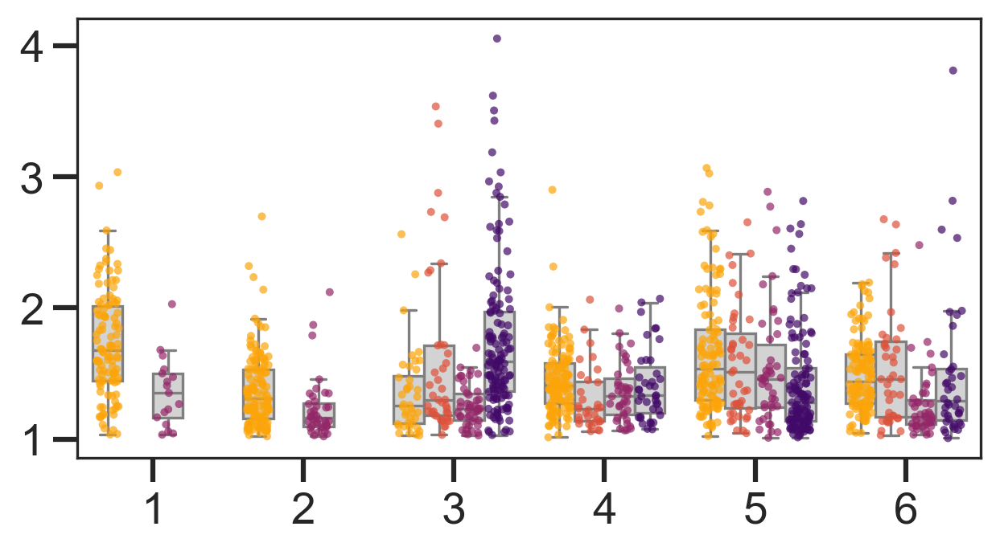

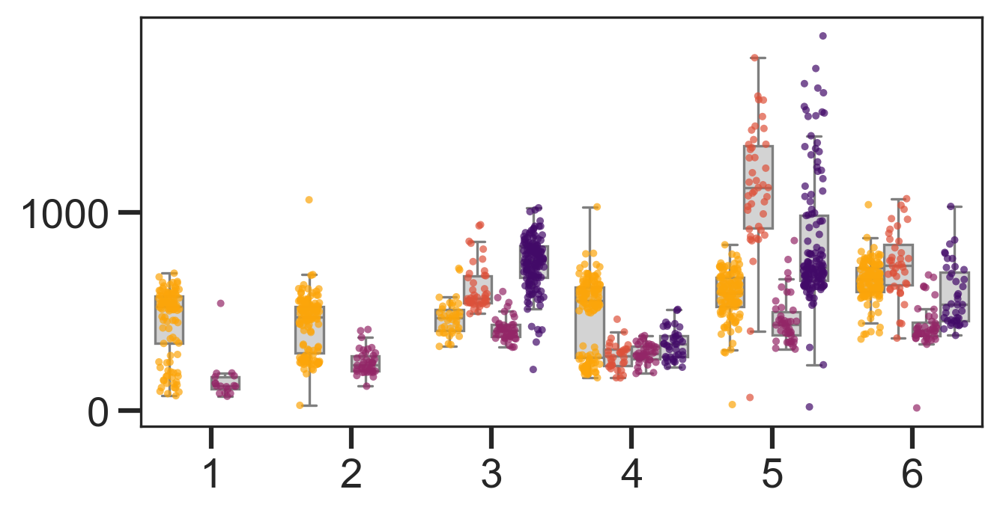

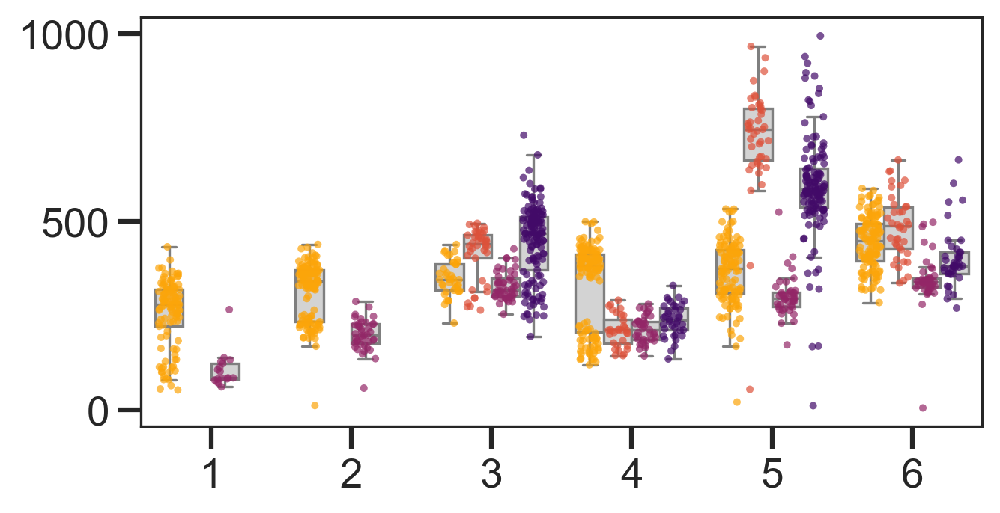

In [1421]:
fontsize = 24
compare_vals['Batch'] = compare_vals['Date'].replace({'01-10-2020': 'B', '30-09-2020': 'B', '23-09-2020':'A', '24-09-2020':'A'})
compare_vals['batches'] = compare_vals['Batch'].astype(str) + '_'+ compare_vals['Chiron Pulse'].astype(str) + '_' + compare_vals['Time Point'].astype(str)
compare_vals['batches'] = compare_vals['batches'].astype('category')

compare_vals['conditions'] = compare_vals['Chiron Pulse'].astype(str) + '_' + compare_vals['Time Point'].astype(str)
compare_vals['conditions'] = compare_vals['conditions'].astype('category')

import matplotlib as mpl

mpl.rcParams['axes.linewidth'] = 1
plots = ['Elongation Index','Spine Length', 'Diameter', 'AR','major_axis_length','minor_axis_length']
for y in plots:

    fig, ax = plt.subplots(figsize=(6,3),linewidth=10)
    #plt.axhline(y = filtered[filtered['Condition_plot'] == '1'][y].median(), 
    #            color = 'grey', linestyle = 'dashed')

    ax = sns.boxplot(data=compare_vals, x="Condition_plot", y=y, hue = 'conditions',
                palette=['lightgrey'],#"colorblind", 
                    order=["1", "2", "3", "4", "5", "6"], fliersize = False,
                ax=ax)

    ax = sns.stripplot(data=compare_vals, x="Condition_plot", y=y, hue = 'conditions',
                  order=["1", "2", "3", "4", "5", "6"],
                  ax=ax,
                palette = 'inferno_r',#['gold','coral','plum','crimson','steelblue','navy'] , 
                  dodge = True, jitter=0.3, marker='o', alpha=0.7, size = 3)

   # plt.setp(ax.xaxis.get_majorticklabels(), ha='center', fontsize = 22)
   # plt.setp(ax.yaxis.get_majorticklabels(), ha='right', fontsize = 22)
    plt.legend([], frameon=False)
    ax.set_xlabel('')
    ax.set_ylabel('')
    #sns.despine()
    #plt.savefig(save + 'figures/brightfield/20240805_B6_Chir_TP_' + str(y) + '.png', dpi = 300)

In [1261]:
from scipy import stats

cond = ['1','2','3','4','5','6']
measure = 'AR'

for  c in cond:
    print('condition ' + str(c))
    for i in compare_vals[compare_vals['Condition_plot'] == c]['conditions'].unique():
        if i != '48h_120hAA':
            if i == '48h_144hAA':
                print('(2)')
            if i == '72h_120hAA':
                print('(3)')
            if i == '72h_144hAA':
                print('(4)')
            print('48h_120hAA vs ' + str(i))
            stat1 = stats.mannwhitneyu(x = compare_vals[(compare_vals['Condition_plot'] == c) & (compare_vals['conditions'] == '48h_120hAA')][measure],
                                       y = compare_vals[(compare_vals['Condition_plot'] == c) & (compare_vals['conditions'] == i)][measure],
                                       alternative = 'two-sided')
            if stat1[1] < 5.00e-02:
                print(stat1)
                print('*')
                if stat1[1] < 1.00e-03:   
                    print('**')
            print('\t')


condition 1
(3)
48h_120hAA vs 72h_120hAA
MannwhitneyuResult(statistic=1446.0, pvalue=0.00030080843598428905)
*
**
	
condition 2
(3)
48h_120hAA vs 72h_120hAA
MannwhitneyuResult(statistic=3657.0, pvalue=0.0006768843739061842)
*
**
	
condition 3
(4)
48h_120hAA vs 72h_144hAA
MannwhitneyuResult(statistic=1346.0, pvalue=1.0206297192476817e-06)
*
**
	
(2)
48h_120hAA vs 48h_144hAA
	
(3)
48h_120hAA vs 72h_120hAA
	
condition 4
(3)
48h_120hAA vs 72h_120hAA
MannwhitneyuResult(statistic=3146.0, pvalue=0.02849938213731019)
*
	
(4)
48h_120hAA vs 72h_144hAA
	
(2)
48h_120hAA vs 48h_144hAA
MannwhitneyuResult(statistic=2929.0, pvalue=0.0005049778784061671)
*
**
	
condition 5
(3)
48h_120hAA vs 72h_120hAA
	
(4)
48h_120hAA vs 72h_144hAA
MannwhitneyuResult(statistic=10416.0, pvalue=3.166785685835704e-07)
*
**
	
(2)
48h_120hAA vs 48h_144hAA
	
condition 6
(4)
48h_120hAA vs 72h_144hAA
MannwhitneyuResult(statistic=3127.0, pvalue=0.02786103548468842)
*
	
(2)
48h_120hAA vs 48h_144hAA
	
(3)
48h_120hAA vs 72h_120hAA

In [1262]:
from scipy import stats

cond = ['1','2','3','4','5','6']
measure = 'major_axis_length'

for  c in cond:
    print('condition ' + str(c))
    for i in compare_vals[compare_vals['Condition_plot'] == c]['conditions'].unique():
        if i != '48h_120hAA':
            if i == '48h_144hAA':
                print('(2)')
            if i == '72h_120hAA':
                print('(3)')
            if i == '72h_144hAA':
                print('(4)')
            print('48h_120hAA vs ' + str(i))
            stat1 = stats.mannwhitneyu(x = compare_vals[(compare_vals['Condition_plot'] == c) & (compare_vals['conditions'] == '48h_120hAA')][measure],
                                       y = compare_vals[(compare_vals['Condition_plot'] == c) & (compare_vals['conditions'] == i)][measure],
                                       alternative = 'two-sided')
            if stat1[1] < 5.00e-02:
                print(stat1)
                print('*')
                if stat1[1] < 1.00e-03:   
                    print('**')
            print('\t')


condition 1
(3)
48h_120hAA vs 72h_120hAA
MannwhitneyuResult(statistic=1677.0, pvalue=1.519327357144483e-07)
*
**
	
condition 2
(3)
48h_120hAA vs 72h_120hAA
MannwhitneyuResult(statistic=4766.0, pvalue=2.144979469340302e-13)
*
**
	
condition 3
(4)
48h_120hAA vs 72h_144hAA
MannwhitneyuResult(statistic=307.0, pvalue=1.4402621083769116e-17)
*
**
	
(2)
48h_120hAA vs 48h_144hAA
MannwhitneyuResult(statistic=154.0, pvalue=3.2467539774961093e-10)
*
**
	
(3)
48h_120hAA vs 72h_120hAA
MannwhitneyuResult(statistic=1316.0, pvalue=0.0006164431793974922)
*
**
	
condition 4
(3)
48h_120hAA vs 72h_120hAA
MannwhitneyuResult(statistic=3799.0, pvalue=4.017637951754403e-06)
*
**
	
(4)
48h_120hAA vs 72h_144hAA
MannwhitneyuResult(statistic=3668.0, pvalue=3.7079859328448665e-05)
*
**
	
(2)
48h_120hAA vs 48h_144hAA
MannwhitneyuResult(statistic=3261.0, pvalue=1.1436148315092028e-06)
*
**
	
condition 5
(3)
48h_120hAA vs 72h_120hAA
MannwhitneyuResult(statistic=4047.0, pvalue=1.1127750893185936e-08)
*
**
	
(4)
48h_12

In [1263]:
filtered_vals = compare_vals[((compare_vals["Condition"]!="3") & (compare_vals["Time Point"]=="120hAA") & (compare_vals["Chiron Pulse"]=="48h")) | ((compare_vals["Condition"]=="3") & (compare_vals["Time Point"]=="144hAA") & (compare_vals["Chiron Pulse"]=="72h"))]
filtered_vals['Batch'] = filtered_vals['Date'].replace({'01-10-2020': 'B', '30-09-2020': 'B', '23-09-2020':'A', '24-09-2020':'A'})
filtered_vals['batches'] = filtered_vals['Batch'].astype(str) + '_'+ filtered_vals['Chiron Pulse'].astype(str) + '_' + filtered_vals['Time Point'].astype(str)


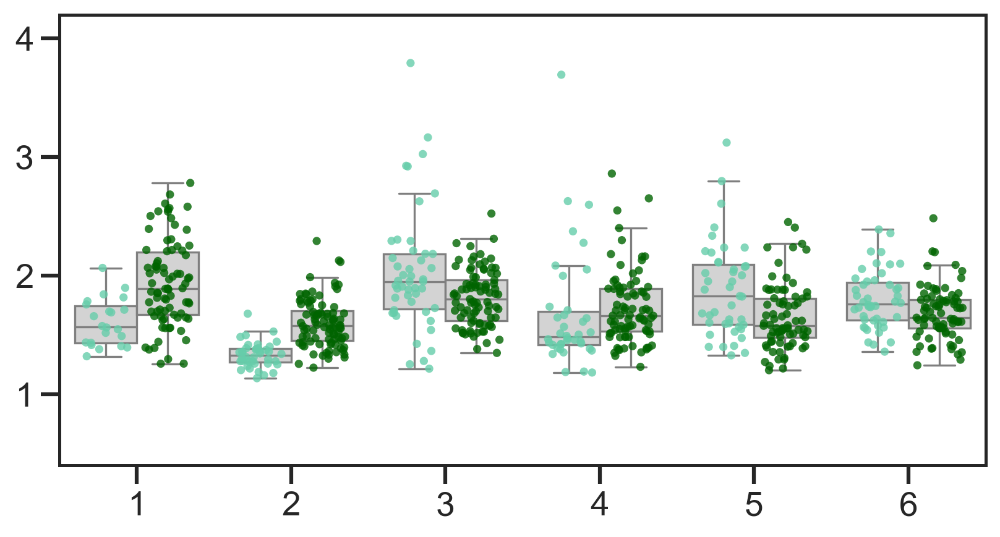

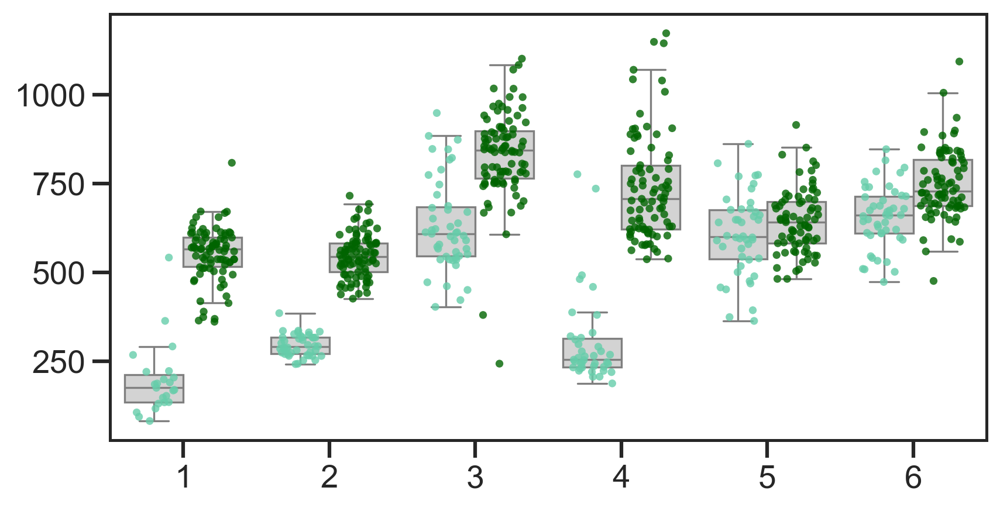

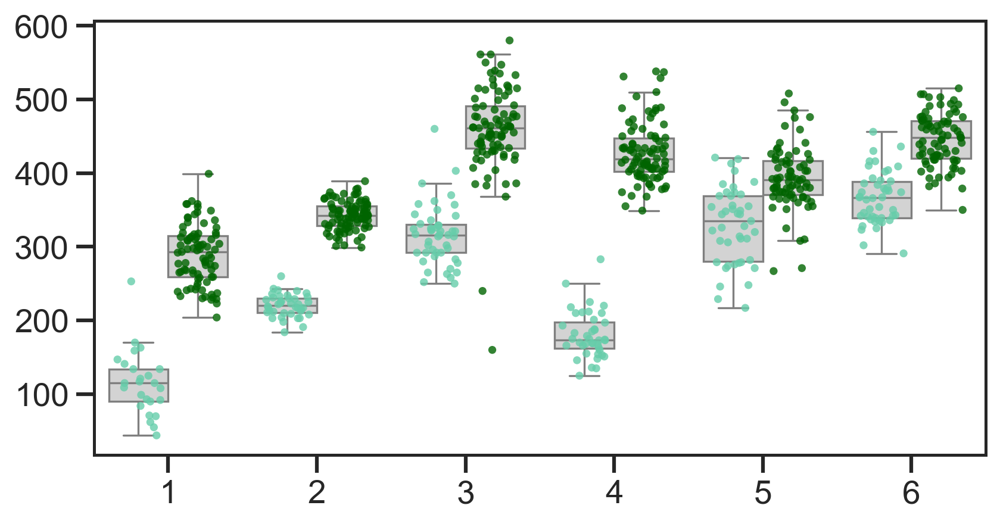

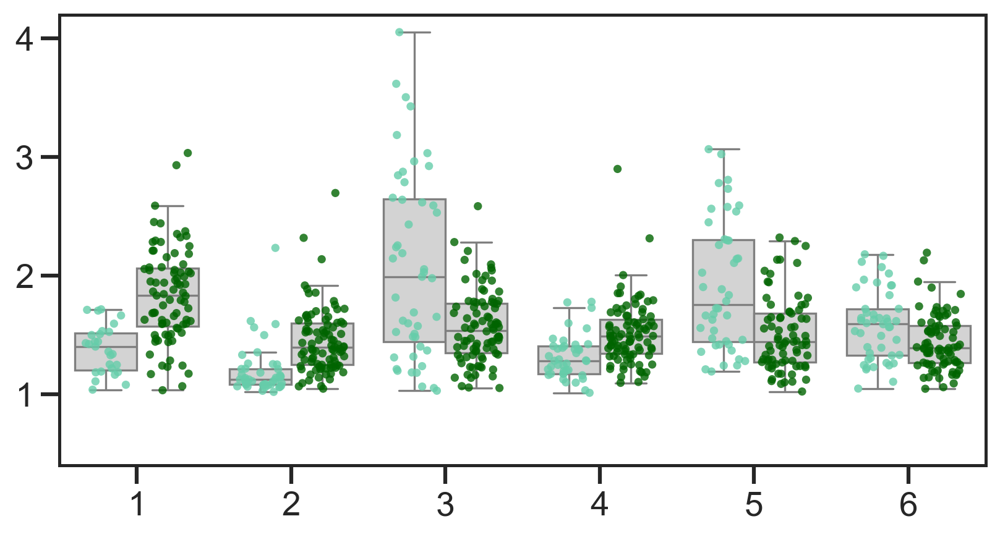

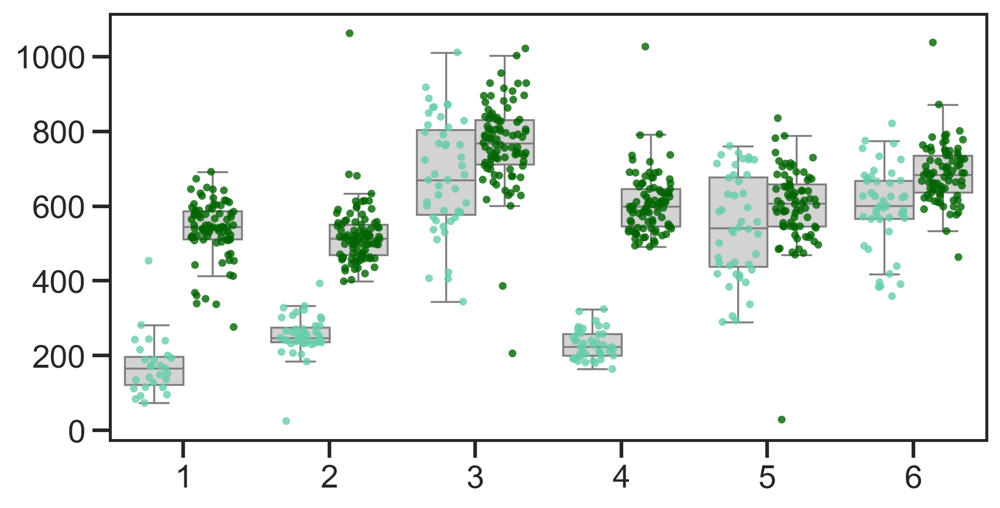

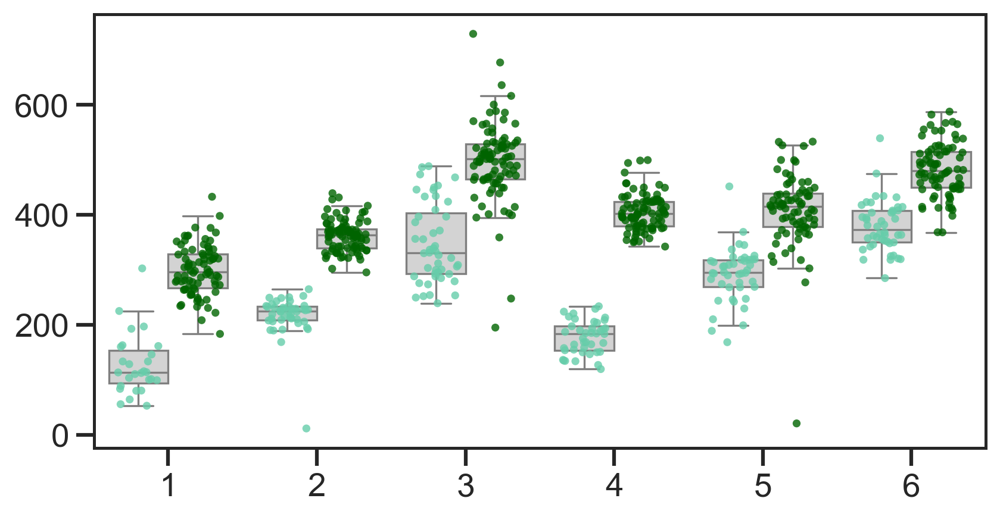

In [1382]:
mpl.rcParams['axes.linewidth'] = 1.5

plots = ['Elongation Index','Spine Length', 'Diameter', 'AR','major_axis_length','minor_axis_length']
for y in plots:
    fig, ax = plt.subplots(figsize=(8,4))
    ax = sns.boxplot(data=filtered_vals, x="Condition_plot", y=y, showfliers = False, 
                     color = "Batch", hue = 'Batch',
                palette=['lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey'],#"colorblind", 
                    order=["1", "2", "3", "4", "5", "6"],
                ax=ax)

    ax = sns.stripplot(data=filtered_vals, x="Condition_plot", y=y, hue = "Batch",
                  order=["1", "2", "3", "4", "5", "6"],
                  ax=ax,
                palette = ['mediumaquamarine','darkgreen'],  
                  dodge = True, jitter=0.3, marker='o', alpha=0.8, size = 4)

    plt.legend([], frameon=False)
    ax.set_xlabel('')
    if y == 'AR' or y == 'Elongation Index':
        ax.set_ylim([0.4,4.2])
    ax.set_ylabel('')
    #sns.despine()
    plt.savefig(save + 'figures/brightfield/20240805_B6_filtered_batchseparated_' + str(y) + '.png', dpi = 300)

In [1278]:
measure = ['AR']#,'major_axis_length']
cond = ['1','2','3','4','5','6']
for c in cond:
    print('condition ' + str(c))
    stat1 = stats.ttest_ind(a = filtered_vals[(filtered_vals['Condition_plot'] == c) & (filtered_vals['Batch'] == 'A')][measure],
                                b = filtered_vals[(filtered_vals['Condition_plot'] == c) & (filtered_vals['Batch'] == 'B')][measure],
                                alternative = 'two-sided')
    
    if stat1[1] < 5.00e-02:
        print('*')
    if stat1[1] < 1.00e-03:   
        print('**')
    print('\t')

condition 1
*
**
	
condition 2
*
**
	
condition 3
*
**
	
condition 4
*
**
	
condition 5
*
**
	
condition 6
*
	


In [1279]:
measure = ['major_axis_length']
cond = ['1','2','3','4','5','6']
for c in cond:
    print('condition ' + str(c))
    stat1 = stats.ttest_ind(a = filtered_vals[(filtered_vals['Condition_plot'] == c) & (filtered_vals['Batch'] == 'A')][measure],
                                b = filtered_vals[(filtered_vals['Condition_plot'] == c) & (filtered_vals['Batch'] == 'B')][measure],
                                alternative = 'two-sided')
    
    if stat1[1] < 5.00e-02:
        print('*')
    if stat1[1] < 1.00e-03:   
        print('**')
    print('\t')

condition 1
*
**
	
condition 2
*
**
	
condition 3
*
**
	
condition 4
*
**
	
condition 5
*
	
condition 6
*
**
	


## multiple cell lines

In [1280]:
TR = pd.read_csv("../../rev_analyse/notebooks/data/TR_AR.csv",sep=';', index_col = None)
TR = pd.DataFrame(TR.unstack()).reset_index().dropna().rename(columns={'level_0':'Condition_plot','level_1':'Name',0:'AR'})
TR['AR'] = [float(str(i).replace(",", ".")) for i in TR["AR"]]

TRmj = pd.read_csv("../../rev_analyse/notebooks/data/TR_major_axis.csv",sep=';', index_col = None)
TRmj = pd.DataFrame(TRmj.unstack()).reset_index().dropna().rename(columns={'level_0':'Condition_plot','level_1':'Name',0:'major'})
TRmj['major'] = [float(str(i).replace(",", ".")) for i in TRmj["major"]]

TRmi = pd.read_csv("../../rev_analyse/notebooks/data/TR_minor_axis.csv",sep=';', index_col = None)
TRmi = pd.DataFrame(TRmi.unstack()).reset_index().dropna().rename(columns={'level_0':'Condition_plot','level_1':'Name',0:'minor'})
TRmi['minor'] = [float(str(i).replace(",", ".")) for i in TRmi["minor"]]

TR['major'] = TRmj['major']
TR['minor'] = TRmi['minor']
TR['Condition_plot'] = [str(i).replace("Group ", "") for i in TR["Condition_plot"]]
TR['line'] = 'TR'
TR['Batch'] = 'A'

IB = pd.read_csv("../../rev_analyse/notebooks/data/IB10_AR.csv",sep=';', index_col = None)
IB = pd.DataFrame(IB.unstack()).reset_index().dropna().rename(columns={'level_0':'Condition_plot','level_1':'Name',0:'AR'})
IB['AR'] = [float(str(i).replace(",", ".")) for i in IB["AR"]]

IBmj = pd.read_csv("../../rev_analyse/notebooks/data/IB10_major_axis.csv",sep=';', index_col = None)
IBmj = pd.DataFrame(IBmj.unstack()).reset_index().dropna().rename(columns={'level_0':'Condition_plot','level_1':'Name',0:'major'})
IBmj['major'] = [float(str(i).replace(",", ".")) for i in IBmj["major"]]

IBmi = pd.read_csv("../../rev_analyse/notebooks/data/IB10_minor_axis.csv",sep=';', index_col = None)
IBmi = pd.DataFrame(IBmi.unstack()).reset_index().dropna().rename(columns={'level_0':'Condition_plot','level_1':'Name',0:'minor'})
IBmi['minor'] = [float(str(i).replace(",", ".")) for i in IBmi["minor"]]

IB['major'] = IBmj['major']
IB['minor'] = IBmi['minor']
IB['Condition_plot'] = [str(i).replace("Group ", "") for i in IB["Condition_plot"]]
IB['line'] = 'IB10'
IB['Batch'] = 'A'

In [1281]:
TR['Condition'] = TR['Condition_plot']

TR['Condition'] = [str(i).replace("10", "k") for i in TR['Condition']]
TR['Condition'] = [str(i).replace("9", "j") for i in TR['Condition']]
TR['Condition'] = [str(i).replace("8", "i") for i in TR['Condition']]
TR['Condition'] = [str(i).replace("7", "h") for i in TR['Condition']]
TR['Condition'] = [str(i).replace("6", "g") for i in TR['Condition']]
TR['Condition'] = [str(i).replace("5", "f") for i in TR['Condition']]
TR['Condition'] = [str(i).replace("4", "e") for i in TR['Condition']]
TR['Condition'] = [str(i).replace("3", "d") for i in TR['Condition']]
TR['Condition'] = [str(i).replace("2", "c") for i in TR['Condition']]
TR['Condition'] = [str(i).replace("1", "b") for i in TR['Condition']]
TR['Condition'] = [str(i).replace("0", "a") for i in TR['Condition']]

TR['Condition'] = [str(i).replace("a", "1") for i in TR['Condition']] #0
TR['Condition'] = [str(i).replace("k", "2") for i in TR['Condition']] #10
TR['Condition'] = [str(i).replace("c", "3") for i in TR['Condition']] #2
TR['Condition'] = [str(i).replace("b", "4") for i in TR['Condition']]#1


In [1282]:
IB['Condition'] = IB['Condition_plot']

IB['Condition'] = [str(i).replace("10", "k") for i in IB['Condition']]
IB['Condition'] = [str(i).replace("9", "j") for i in IB['Condition']]
IB['Condition'] = [str(i).replace("8", "i") for i in IB['Condition']]
IB['Condition'] = [str(i).replace("7", "h") for i in IB['Condition']]
IB['Condition'] = [str(i).replace("6", "g") for i in IB['Condition']]
IB['Condition'] = [str(i).replace("5", "f") for i in IB['Condition']]
IB['Condition'] = [str(i).replace("4", "e") for i in IB['Condition']]
IB['Condition'] = [str(i).replace("3", "d") for i in IB['Condition']]
IB['Condition'] = [str(i).replace("2", "c") for i in IB['Condition']]
IB['Condition'] = [str(i).replace("1", "b") for i in IB['Condition']]
IB['Condition'] = [str(i).replace("0", "a") for i in IB['Condition']]

IB['Condition'] = [str(i).replace("a", "1") for i in IB['Condition']] #0
IB['Condition'] = [str(i).replace("k", "2") for i in IB['Condition']] #10
IB['Condition'] = [str(i).replace("c", "3") for i in IB['Condition']] #2
IB['Condition'] = [str(i).replace("b", "4") for i in IB['Condition']]#1


In [1283]:
rep = pd.read_csv("../../rev_analyse/notebooks/data/replicates_AR.csv",sep=';', index_col = None)
rep = pd.DataFrame(rep.unstack()).reset_index().dropna().rename(columns={'level_0':'Condition_plot','level_1':'Name',0:'AR'})
rep['AR'] = [float(str(i).replace(",", ".")) for i in rep["AR"]]

repmj = pd.read_csv("../../rev_analyse/notebooks/data/replicates_major_axis.csv",sep=';', index_col = None)
repmj = pd.DataFrame(repmj.unstack()).reset_index().dropna().rename(columns={'level_0':'Condition_plot','level_1':'Name',0:'major'})
repmj['major'] = [float(str(i).replace(",", ".")) for i in repmj["major"]]

repmi = pd.read_csv("../../rev_analyse/notebooks/data/replicates_minor_axis.csv",sep=';', index_col = None)
repmi = pd.DataFrame(repmi.unstack()).reset_index().dropna().rename(columns={'level_0':'Condition_plot','level_1':'Name',0:'minor'})
repmi['minor'] = [float(str(i).replace(",", ".")) for i in repmi["minor"]]

rep['major'] = repmj['major']
rep['minor'] = repmi['minor']
rep['Condition_plot'] = [str(i).replace("Group ", "") for i in rep["Condition_plot"]]
rep[['line', 'Condition']]  = rep['Condition_plot'].str.split(' ', expand = True)
rep['line'] = rep['line'].replace({'hub':'IB10', 'triple':'TR'})
rep['Condition'] = rep['Condition'].replace({'serum':'1', '2i':'2'})
rep['Batch'] = 'B'

In [1284]:
B6 = compare_vals[(compare_vals['Chiron Pulse'] == '48h') & (compare_vals['Time Point'] == '120hAA')][['Condition','AR','major_axis_length','minor_axis_length','Batch']].reset_index()
B6 = B6.rename(columns={
                   'sample':'Name',
                   'major_axis_length':'major',
                   'minor_axis_length':'minor'})
B6['line'] = 'B6'

In [1285]:
all = pd.concat([TR,IB,B6,rep])

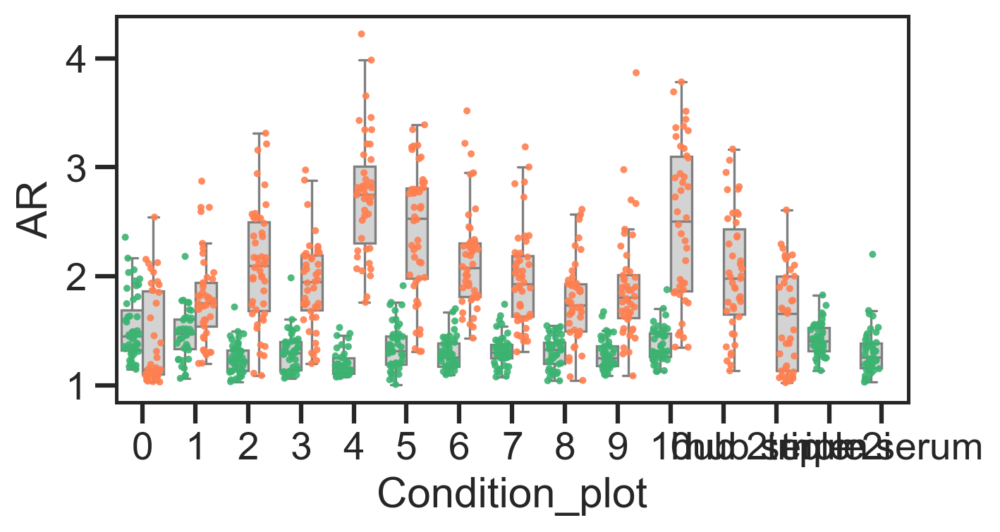

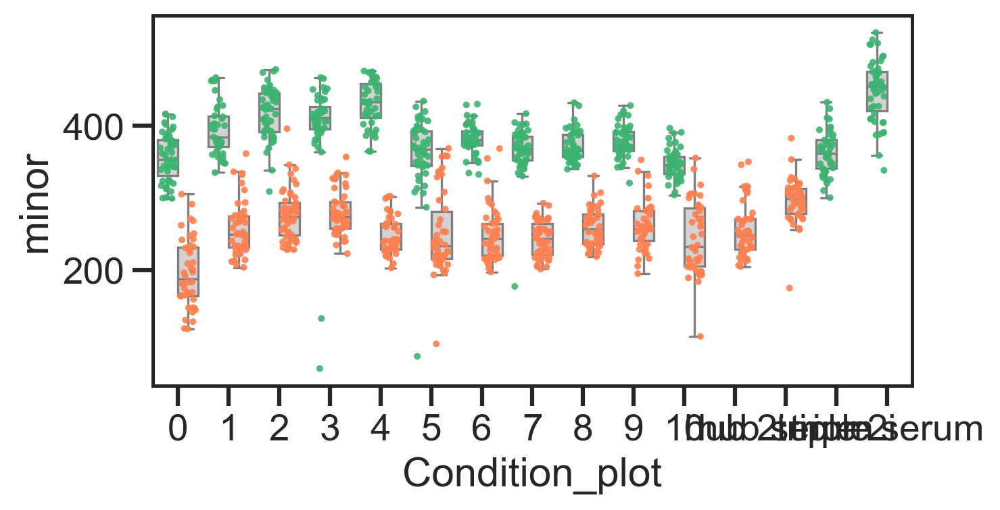

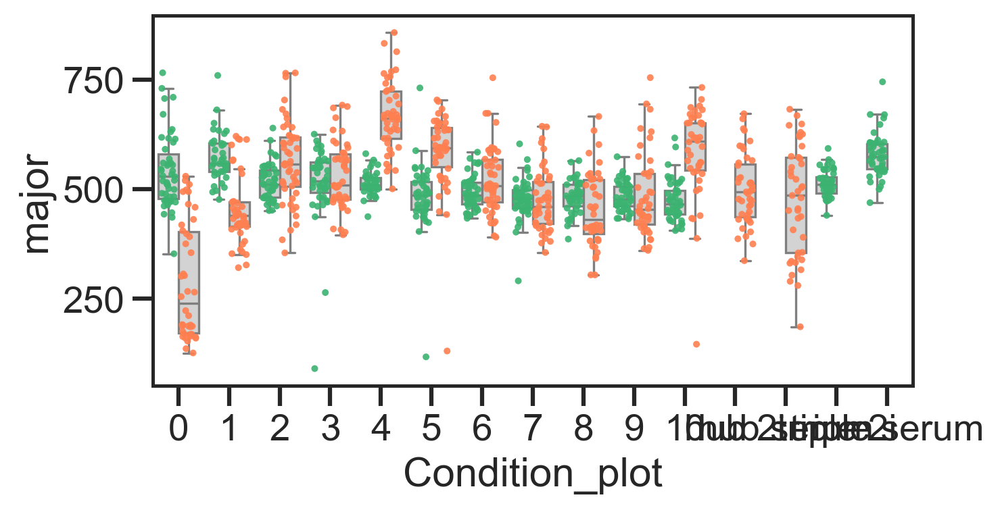

In [1286]:
plot_vals = ['AR','minor','major']
save = '/Users/m.blotenburg/Documents/Projects/preculture_manuscript/rev_analyse/notebooks/'
for x in plot_vals:
    fig, ax = plt.subplots(figsize=(6,3))
    ax = sns.boxplot(data=all[all['line'] != 'B6'],#.astype(int) < 4], 
                     x="Condition_plot", y=x, showfliers = False, hue = 'line',
                palette=['lightgrey','lightgrey'],#"colorblind", 
                   # order=["1", "2", "3", "4", "5", "6"],
                ax=ax)
    
    ax = sns.stripplot(data=all[all['line'] != 'B6'],#.astype(int) < 4],
                       x="Condition_plot", y=x, 
                #  order=["1", "2", "3", "4", "5", "6"],
                  ax=ax,
                palette = ['mediumseagreen','coral'],  hue = 'line',
                  dodge = True, jitter=0.3, marker='o', alpha=0.9, size = 3)
    plt.legend([],frameon=False)
    plt.savefig(save + 'figures/brightfield/20240801_TR_IB10_allconditions_conditionsplit_' + str(x) + '.png', dpi = 300)

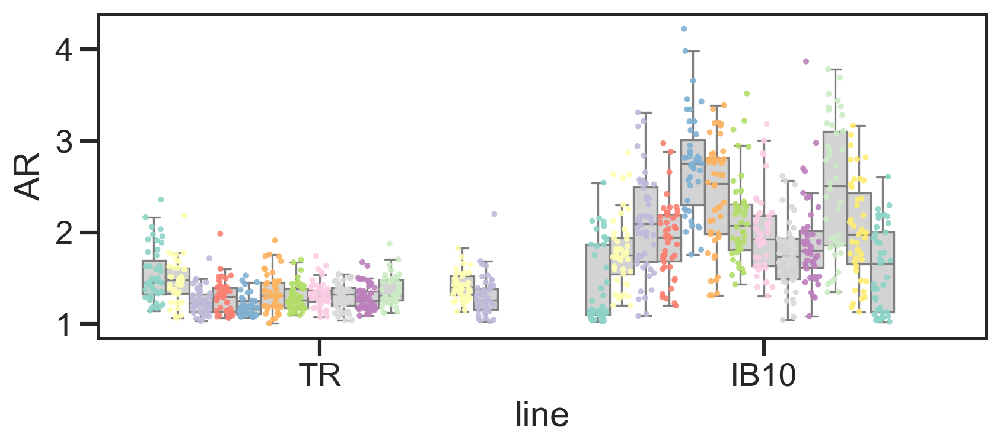

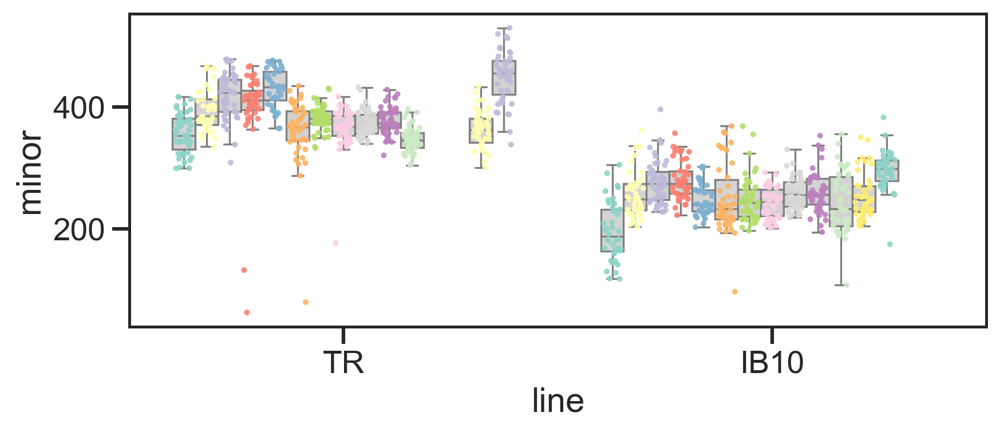

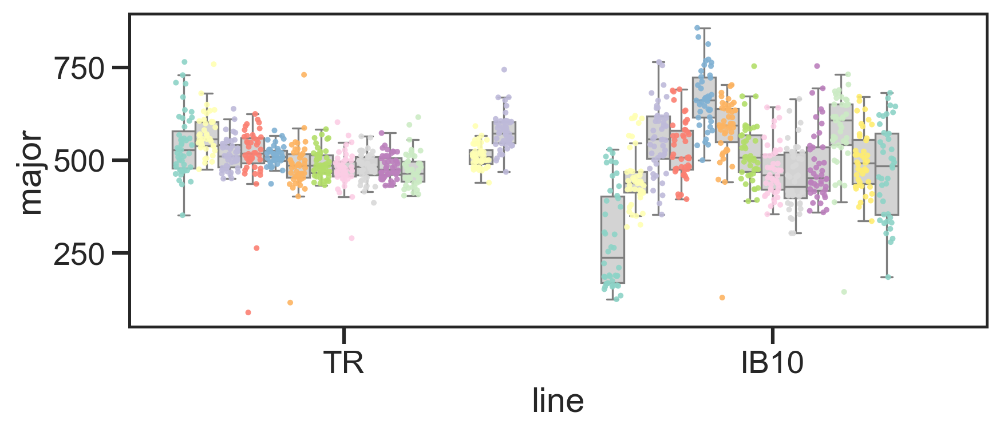

In [1287]:
plot_vals = ['AR','minor','major']
save = '/Users/m.blotenburg/Documents/Projects/preculture_manuscript/rev_analyse/notebooks/'
for x in plot_vals:
    fig, ax = plt.subplots(figsize=(8,3))
    ax = sns.boxplot(data=all[all['line'] != 'B6'], 
                     x="line", y=x, showfliers = False, hue = 'Condition_plot',
                palette=['lightgrey','lightgrey','lightgrey','lightgrey',
                        'lightgrey','lightgrey','lightgrey','lightgrey',
                        'lightgrey','lightgrey','lightgrey'],#"colorblind", 
                   # order=["1", "2", "3", "4", "5", "6"],
                ax=ax)
    
    ax = sns.stripplot(data=all[all['line'] != 'B6'],
                       x="line", y=x, 
                #  order=["1", "2", "3", "4", "5", "6"],
                  ax=ax,
                palette = 'Set3',#['mediumseagreen','coral','cornflowerblue','gold'],  
                       hue = 'Condition_plot',
                  dodge = True, jitter=0.3, marker='o', alpha=0.9, size = 3)
    plt.legend([],frameon=False)
    plt.savefig(save + 'figures/brightfield/20240801_TR_IB10_allconditions_' + str(x) + '.png', dpi = 300)


In [1288]:
all_f = all[(all['Condition'] == '1') | (all['Condition'] == '2') | (all['Condition'] == '3') | (all['Condition'] == '4')]

In [1290]:
sc.set_figure_params(dpi = 120)
sns.set_style('white')
sns.set_style('ticks')
sns.set_context('talk')

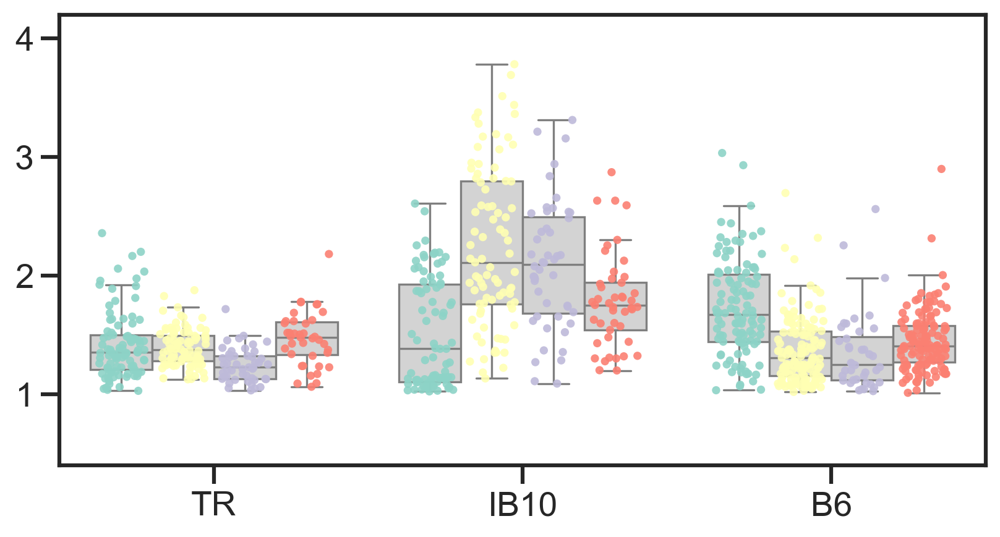

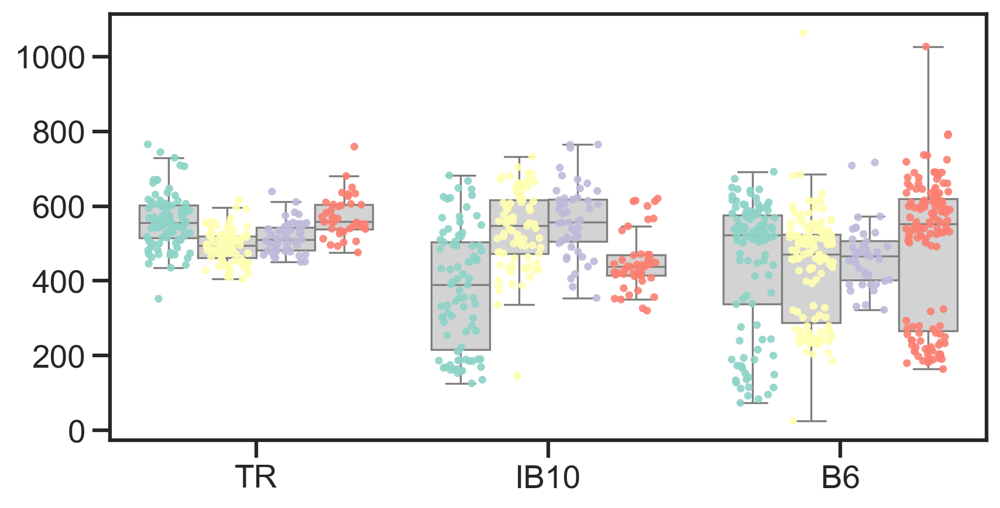

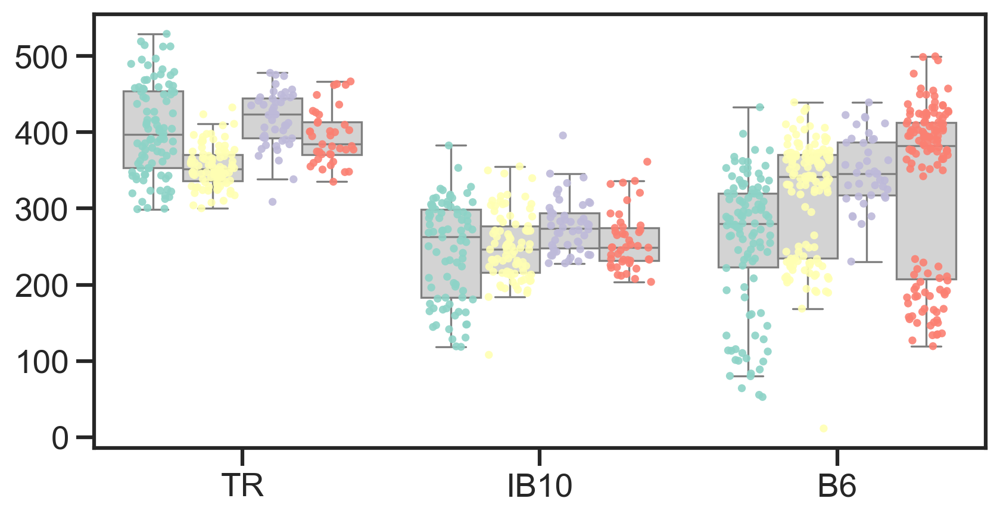

In [1293]:
all_f['Condition'] = all_f['Condition'].astype(int)

plot_vals = ['AR','major','minor']
save = '/Users/m.blotenburg/Documents/Projects/preculture_manuscript/rev_analyse/notebooks/'
for x in plot_vals:
    fig, ax = plt.subplots(figsize=(8,4))
    ax = sns.boxplot(data=all_f, 
                     x="line", y=x, showfliers = False, hue = 'Condition',
                palette=['lightgrey','lightgrey','lightgrey','lightgrey',
                        'lightgrey','lightgrey','lightgrey','lightgrey',
                        'lightgrey','lightgrey','lightgrey'],#"colorblind", 
                   # order=["1", "2", "3", "4", "5", "6"],
                ax=ax)
    
    ax = sns.stripplot(data=all_f, 
                       x="line", y=x, 
                #  order=["1", "2", "3", "4", "5", "6"],
                  ax=ax,
                palette = 'Set3',#['mediumseagreen','coral','cornflowerblue','gold'],  
                       hue = 'Condition',
                  dodge = True, jitter=0.3, marker='o', alpha=0.9, size = 4)
    if x == 'AR' or x == 'Elongation Index':
        ax.set_ylim([0.4,4.2])
    plt.legend([],frameon=False)
    plt.ylabel('')
    plt.xlabel('')
    plt.savefig(save + 'figures/brightfield/20240805_celllines_' + str(x) + '.png', dpi = 300)


In [1294]:
all_f['line_cond'] = all_f['line'] + '_' + all_f['Condition'].astype(str)
all_f

,Condition_plot,Name,AR,major,minor,line,Batch,Condition,line_cond
0,0,0,1.489000,481.6393,323.4649,TR,A,1,TR_1
1,0,1,1.957454,765.1796,390.9055,TR,A,1,TR_1
2,0,2,1.492207,470.0727,315.0185,TR,A,1,TR_1
3,0,3,1.468196,553.6559,377.0994,TR,A,1,TR_1
4,0,4,1.912977,606.4918,317.0409,TR,A,1,TR_1
...,...,...,...,...,...,...,...,...,...
183,triple serum,42,1.038217,515.7673,496.7817,TR,B,1,TR_1
184,triple serum,43,1.177966,611.7159,519.2984,TR,B,1,TR_1
185,triple serum,44,1.056317,543.4428,514.4694,TR,B,1,TR_1
186,triple serum,45,1.209492,540.3151,446.7290,TR,B,1,TR_1


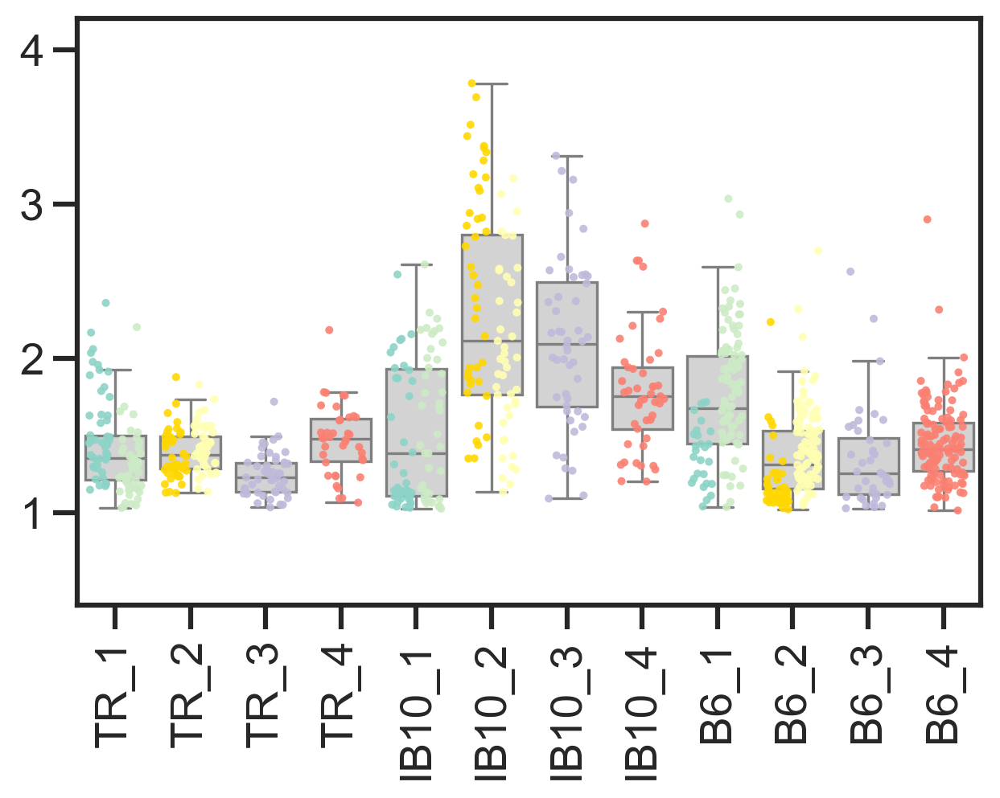

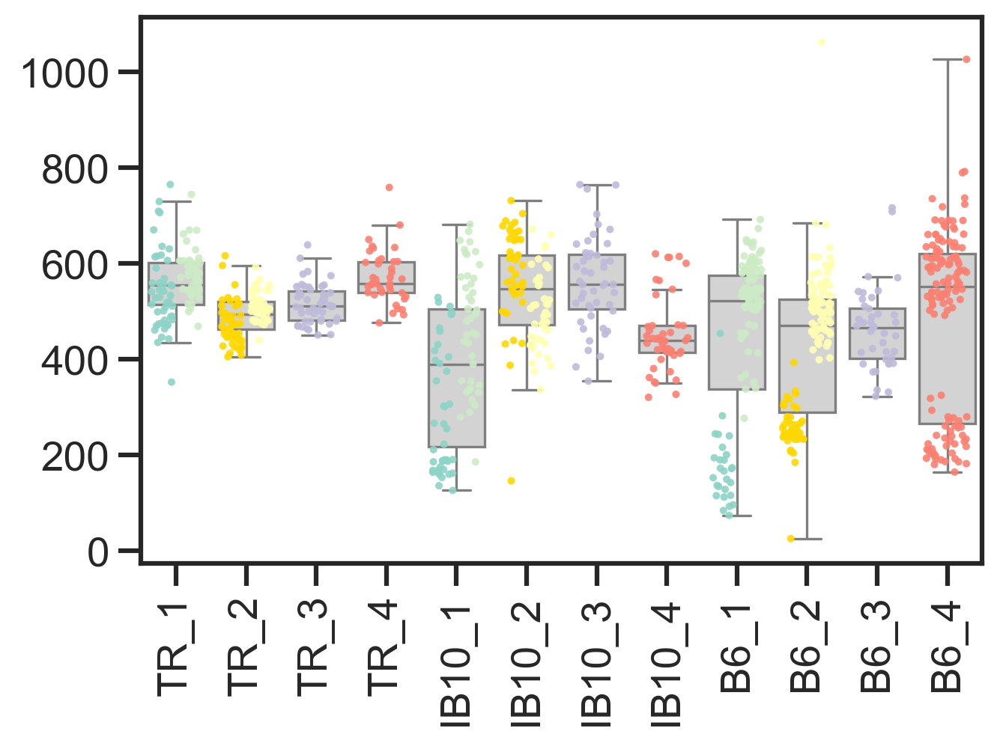

In [1368]:
plot_vals = ['AR','major']#,'minor','major']
save = '/Users/m.blotenburg/Documents/Projects/preculture_manuscript/rev_analyse/notebooks/'

order = ['TR_1', 'TR_2', 'TR_3', 'TR_4',
          'IB10_1', 'IB10_2', 'IB10_3','IB10_4', 
          'B6_1', 'B6_2', 'B6_3', 'B6_4']
#[sns.color_palette('Set3')[11]]
cols = [sns.color_palette('Set3')[0]] + [sns.color_palette('Set3')[10]] + ['gold'] + [sns.color_palette('Set3')[1]] +sns.color_palette('Set3')[2:4]

for x in plot_vals:
    fig, ax = plt.subplots(figsize=(6,4))
    ax = sns.boxplot(data=all_f, 
                     x="line_cond", y=x, showfliers = False, order = order,#hue = 'Batch', dodge = False,
                palette=['lightgrey','lightgrey','lightgrey','lightgrey',
                        'lightgrey','lightgrey','lightgrey','lightgrey',
                        'lightgrey','lightgrey','lightgrey'],#"colorblind", 
                   # order=["1", "2", "3", "4", "5", "6"],
                ax=ax)
    
    ax = sns.stripplot(data=all_f, 
                       x="line_cond", y=x, 
                  order=["TR_1",'IB10_1','B6_1'],
                  ax=ax,
                       palette = cols[0:2],# ['mediumaquamarine','darkgreen'],  
                       hue = 'Batch',#order = order,
                  dodge = True, jitter=0.3, marker='o', alpha=0.9, size = 3)
    ax = sns.stripplot(data=all_f, 
                       x="line_cond", y=x, 
                  order=["TR_2",'IB10_2','B6_2'],
                  ax=ax,
                       palette = cols[2:4],# ['mediumaquamarine','darkgreen'],  
                       hue = 'Batch',#order = order,
                  dodge = True, jitter=0.3, marker='o', alpha=0.9, size = 3)

    ax = sns.stripplot(data=all_f, 
                       x="line_cond", y=x, 
                  order=["TR_3",'IB10_3','B6_3'],
                  ax=ax,
                       palette = [cols[4]],
                       hue = 'Condition',
                       jitter=0.3, marker='o', alpha=0.9, size = 3)
    
    ax = sns.stripplot(data=all_f, 
                       x="line_cond", y=x, 
                  order=["TR_4",'IB10_4','B6_4'],
                  ax=ax,
                       palette = [cols[5]],
                       hue = 'Condition',
                       jitter=0.3, marker='o', alpha=0.9, size = 3)
    if x == 'AR' or x == 'Elongation Index':
        ax.set_ylim([0.4,4.2])
    plt.legend([],frameon=False)
    plt.ylabel('')
    plt.xlabel('')
    plt.xticks(rotation = 90)
   # plt.savefig(save + 'figures/brightfield/20240805_celllines_' + str(x) + '.png', dpi = 300)


In [1301]:
all_f['condition_batch'] = all_f['Condition'].astype(str) + '_' + all_f['Batch']
all_f.head(2)

,Condition_plot,Name,AR,major,minor,line,Batch,Condition,line_cond,condition_batch
0,0,0,1.489000,481.6393,323.4649,TR,A,1,TR_1,1_A
1,0,1,1.957454,765.1796,390.9055,TR,A,1,TR_1,1_A


In [1303]:
all_f['condition_batch'] = all_f['condition_batch'].replace({'3_A':'3','4_A':'4','4_B':'4'})

In [1305]:
cols = [sns.color_palette('Set3')[0]] + [sns.color_palette('Set3')[10]] + [sns.color_palette('Set3')[11]] + [sns.color_palette('Set3')[1]] +sns.color_palette('Set3')[2:4]


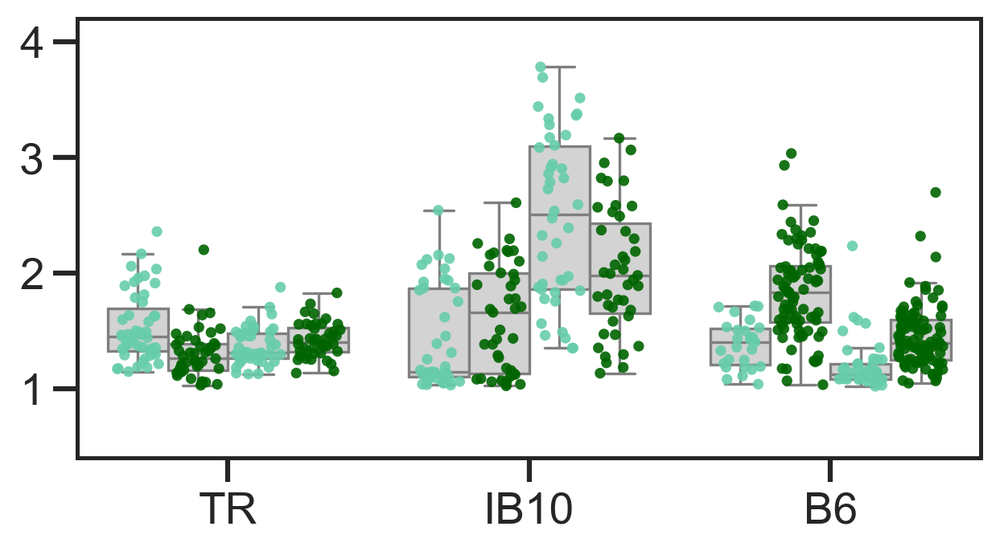

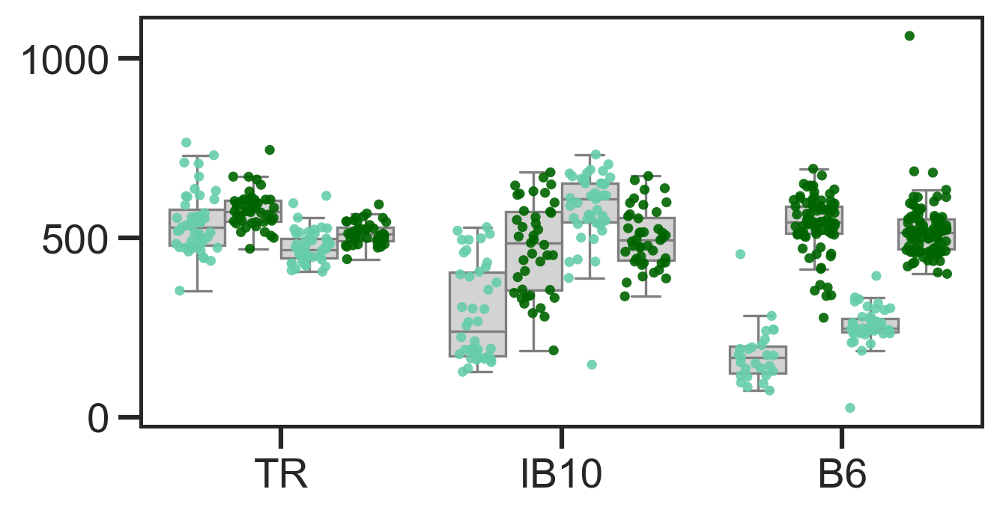

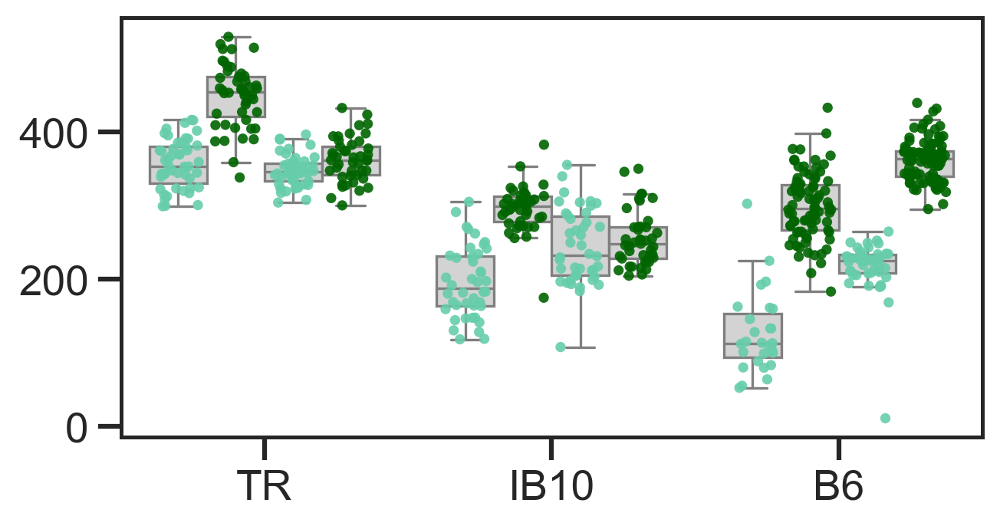

In [1398]:
plot_vals = ['AR','major','minor']
save = '/Users/m.blotenburg/Documents/Projects/preculture_manuscript/rev_analyse/notebooks/'
for x in plot_vals:
    fig, ax = plt.subplots(figsize=(6,3))
    ax = sns.boxplot(data=all_f, 
                     x="line", y=x, showfliers = False, hue = 'condition_batch',
                palette=['lightgrey','lightgrey','lightgrey','lightgrey',
                        'lightgrey','lightgrey','lightgrey','lightgrey',
                        'lightgrey','lightgrey','lightgrey'],#"colorblind", 
                    hue_order=["1_A", "1_B", "2_A", "2_B"],
                ax=ax)
    
    ax = sns.stripplot(data=all_f, 
                       x="line", y=x, 
                    hue_order=["1_A", "1_B", "2_A", "2_B"],
                  ax=ax,
                palette = ['mediumaquamarine','darkgreen'],
                       hue = 'condition_batch',
                  dodge = True, jitter=0.3, marker='o', alpha=0.9, size = 4)
    if x == 'AR' or x == 'Elongation Index':
        ax.set_ylim([0.4,4.2])
    plt.legend([],frameon=False)
    plt.ylabel('')
    plt.xlabel('')
    plt.savefig(save + 'figures/brightfield/20240811_celllines_replicates_' + str(x) + '.png', dpi = 300)


In [1431]:
measure = ['AR']
line = ['TR','IB10','B6']
cond = [1,2]

for l in line:
    print(l)
    for c in cond:
        print('condition ' + str(c))
        stat1 = stats.ttest_ind(a = all_f[(all_f['Condition'] == c) & (all_f['Batch'] == 'A') & (all_f['line'] == l)][measure],
                                b = all_f[(all_f['Condition'] == c) & (all_f['Batch'] == 'B') & (all_f['line'] == l)][measure],
                                    alternative = 'two-sided')
        
        if stat1[1] < 5.00e-02:
            print('*')
        if stat1[1] < 1.00e-03:   
            print('**')
        print('\t')

TR
condition 1
*
**
	
condition 2
	
IB10
condition 1
	
condition 2
*
	
B6
condition 1
*
**
	
condition 2
*
**
	


In [1429]:
measure = ['major']
line = ['TR','IB10','B6']
cond = [1,2]

for l in line:
    print(l)
    for c in cond:
        print('condition ' + str(c))
        stat1 = stats.ttest_ind(a = all_f[(all_f['Condition'] == c) & (all_f['Batch'] == 'A') & (all_f['line'] == l)][measure],
                                b = all_f[(all_f['Condition'] == c) & (all_f['Batch'] == 'B') & (all_f['line'] == l)][measure],
                                    alternative = 'two-sided')
        
        if stat1[1] < 5.00e-02:
            print('*')
        if stat1[1] < 1.00e-03:   
            print('**')
        print('\t')

TR
condition 1
*
	
condition 2
*
**
	
IB10
condition 1
*
**
	
condition 2
*
**
	
B6
condition 1
*
**
	
condition 2
*
**
	


In [1155]:
line = ['TR','IB10','B6']
cond = [2,3,4]
measure = 'AR'
for  l in line:
    print(l)
    for c in cond:
        print('c1 vs c' + str(c))
        stat1 = stats.mannwhitneyu(x = all_f[(all_f['line'] == l) & (all_f['Condition'] == 1)][measure],
                                    y = all_f[(all_f['line'] == l) & (all_f['Condition'] == c)][measure],
                                    alternative = 'two-sided')
        if stat1[1] < 5.00e-02:
            print(stat1)
            print('*')
        if stat1[1] < 1.00e-03:   
            print('**')
        print('\t')

TR
c1 vs c2
MannwhitneyuResult(statistic=1408.0, pvalue=0.012111036736973094)
*
	
c1 vs c3
MannwhitneyuResult(statistic=1809.0, pvalue=1.017457951544902e-07)
*
**
	
c1 vs c4
	
IB10
c1 vs c2
MannwhitneyuResult(statistic=193.0, pvalue=7.303803955800279e-10)
*
**
	
c1 vs c3
MannwhitneyuResult(statistic=332.0, pvalue=4.6753055466094136e-08)
*
**
	
c1 vs c4
MannwhitneyuResult(statistic=483.0, pvalue=8.852906531323954e-05)
*
**
	
B6
c1 vs c2
MannwhitneyuResult(statistic=11428.0, pvalue=4.0396006768143226e-13)
*
**
	
c1 vs c3
MannwhitneyuResult(statistic=3451.0, pvalue=1.0697145576964985e-07)
*
**
	
c1 vs c4
MannwhitneyuResult(statistic=10305.0, pvalue=8.942010755393718e-09)
*
**
	


In [1156]:
line = ['TR','IB10','B6']
cond = [2,3,4]
measure = 'major'
for  l in line:
    print(l)
    for c in cond:
        print('c1 vs c' + str(c))
        stat1 = stats.mannwhitneyu(x = all_f[(all_f['line'] == l) & (all_f['Condition'] == 1)][measure],
                                    y = all_f[(all_f['line'] == l) & (all_f['Condition'] == c)][measure],
                                    alternative = 'two-sided')
        if stat1[1] < 5.00e-02:
            print(stat1)
            print('*')
        if stat1[1] < 1.00e-03:   
            print('**')
        print('\t')




TR
c1 vs c2
MannwhitneyuResult(statistic=1669.0, pvalue=6.347545886490321e-06)
*
**
	
c1 vs c3
	
c1 vs c4
MannwhitneyuResult(statistic=619.0, pvalue=0.009984720278158665)
*
	
IB10
c1 vs c2
MannwhitneyuResult(statistic=86.0, pvalue=1.1062853082821142e-12)
*
**
	
c1 vs c3
MannwhitneyuResult(statistic=111.0, pvalue=4.1487772937502444e-13)
*
**
	
c1 vs c4
MannwhitneyuResult(statistic=348.0, pvalue=4.0463207306348427e-07)
*
**
	
B6
c1 vs c2
MannwhitneyuResult(statistic=8613.0, pvalue=0.031377379113861015)
*
	
c1 vs c3
	
c1 vs c4
MannwhitneyuResult(statistic=5656.0, pvalue=0.004072199903012441)
*
	


## FACS plots

In [1497]:
serum_2i = pd.DataFrame({'condition':['serum','serum','serum',
             '2i','2i','2i','serum','serum','serum',
             '2i','2i','2i'],
 'lineage':['Ect','Mes','End',
            'Ect','Mes','End',
            'Ect','Mes','End',
            'Ect','Mes','End'],
'value':[14.3,8.75,7.79,
         5.64,27.5,6.06,
         2.10,2.66,7.14,
         0.76,15.1,5.01],
'replicate':['A','A','A','A','A','A',
    'B','B','B','B','B','B']})

serum_2i['x'] = serum_2i['condition'] + '_' + serum_2i['lineage']
serum_2i


,condition,lineage,value,replicate,x
0,serum,Ect,14.30,A,serum_Ect
1,serum,Mes,8.75,A,serum_Mes
2,serum,End,7.79,A,serum_End
3,2i,Ect,5.64,A,2i_Ect
4,2i,Mes,27.50,A,2i_Mes
5,2i,End,6.06,A,2i_End
6,serum,Ect,2.10,B,serum_Ect
7,serum,Mes,2.66,B,serum_Mes
8,serum,End,7.14,B,serum_End
9,2i,Ect,0.76,B,2i_Ect


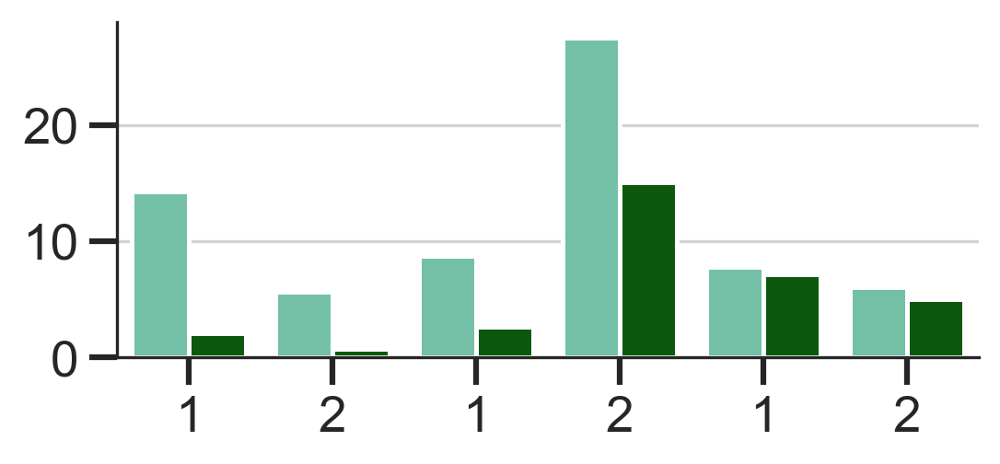

In [1498]:
pal2 = sns.color_palette('Set3')[0:2] + [sns.color_palette('Set3')[3]]

order = ['serum_Ect','2i_Ect',
         'serum_Mes','2i_Mes',
         'serum_End','2i_End']
fig,ax=plt.subplots(figsize=(5,2))
ax.axhline(10,color='lightgrey',lw = 1,zorder=0)
ax.axhline(20,color='lightgrey',lw = 1,zorder=0)
sns.barplot(data = serum_2i,
           x = 'x',
           y = 'value',
           hue = 'replicate',
            order = order,
           # hue_order = ['serum', '2i','2d 2i', '1d 2i',],
            palette = ['mediumaquamarine','darkgreen'],#'Set3',#pal2,
            zorder=1,
           ax=ax)
sns.despine()
ax.set_ylabel('')
ax.set_xlabel('')
ax.legend([],#bbox_to_anchor = (1,0.8),
          frameon=False)
#ax.tick_params(axis='x', labelrotation=90)
ax.set_xticklabels(['1','2','1','2','1','2'])
#ax.set_xticklabels(['Mt1+\n(ect)','T+\n(mes)','Sox17+\n(end)'])
#ax.set_xticklabels(['Ect (Mt1+)','Mes (T+)','End (Sox17+)'])

plt.savefig(save + 'figures/20240812_FACSdata_reps.png', dpi = 300, bbox_inches = 'tight')

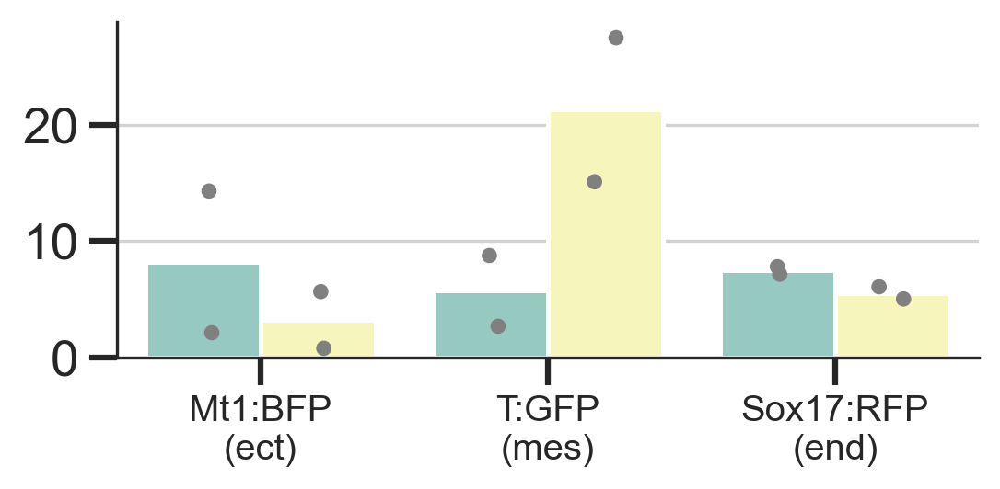

In [1506]:
pal2 = sns.color_palette('Set3')[0:2] + [sns.color_palette('Set3')[3]]

order = ['serum_Ect','serum_Mes','serum_End',
        '2i_Ect','2i_Mes','2i_End']
fig,ax=plt.subplots(figsize=(5,2))
ax.axhline(10,color='lightgrey',lw = 1,zorder=0)
ax.axhline(20,color='lightgrey',lw = 1,zorder=0)
sns.barplot(data = serum_2i,errorbar = None,
           x = 'lineage',
           y = 'value',
           hue = 'condition',
            #order = order,
           # hue_order = ['serum', '2i','2d 2i', '1d 2i',],
            palette = 'Set3',#pal2,
            zorder=1,
           ax=ax)

sns.stripplot(data = serum_2i,
           x = 'lineage',
           y = 'value',
              hue = 'condition',
              dodge = True,
            palette = ['grey'],#pal2,
            zorder=1,
           ax=ax)

sns.despine()
ax.set_ylabel('')
ax.set_xlabel('')
ax.legend([],#bbox_to_anchor = (1,0.8),
          frameon=False)
ax.tick_params(axis='x', labelrotation=0, labelsize = 12)
ax.set_xticklabels(['Mt1:BFP\n(ect)','T:GFP\n(mes)','Sox17:RFP\n(end)'])
#ax.set_xticklabels(['Ect (Mt1+)','Mes (T+)','End (Sox17+)'])

plt.savefig(save + 'figures/20240812_FACSdata_reps2.png', dpi = 300, bbox_inches = 'tight')